## Import

In [11]:
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor

from sklearn.model_selection import GridSearchCV 

from ML.utils.utils import gaussian

import pandas as pd

In [12]:
from ML.utils.utils import *
from ML.utils.Data_preparator import Data_preparator
from ML.utils.Model_evaluator import Model_evaluator
from physics.Iso_data_handler import Iso_data_handler

In [13]:
pre_path = "../../../../../../"
physical_model = "PARSEC"
path_to_data = pre_path + "data/PARSEC/"
path_to_results = pre_path + "results/model_B/fine_tuned_models/"
path_to_predictions = pre_path + "predictions/model_B/fine_tuned_models/"
output_parameters = ['T_eff', 'log_g', 'radius']
categories_name = ["phase"]
scoring = ["neg_root_mean_squared_error", "neg_mean_absolute_error"] # RMSE and MAE

In [14]:
override = True
use_preds = False
save = True
show = True

In [15]:
def display_grid_search(gscv):
    df = pd.DataFrame.from_dict(gscv.cv_results_)
    pd.set_option('display.max_columns', None)
    display(df)
    print(f"Best parameters {gscv.best_params_}")
    print(f"Best score {gscv.best_score_}")

## Data preparation

In [16]:
iso_handler = Iso_data_handler(path_to_data, 
                              ['logAge', 'logTe', 'logg', 'label', 'metallicity', 'Mass', 'Rpol'], 
                              physical_model, rescale=True)

iso_df = iso_handler.get_isochrone_dataframe()

Reading PARSEC dataframe from PARSEC_rescaled_iso_full_data.csv file...


In [17]:
phase_filtered_iso_df = Data_preparator.filter_data(iso_df, {'label':[1, 2, 3, 4, 5, 6]})

In [18]:
X_train, X_ivs, y_train, y_ivs, categories_train, categories_ivs = \
    Data_preparator.split_data(phase_filtered_iso_df, x_cols=['logAge', 'metallicity', 'Mass'], 
                               y_cols=['logTe', 'logg', 'Rpol'], categories_cols=['label'], random_state=12, print_stats=True)

print(X_train.shape, X_ivs.shape)
print(y_train.shape, y_ivs.shape)

Training set statistics:
Range in train data for the logTe parameter : 3.3621 - 4.5177
Median value in train data for the logTe parameter: 3.721
Mean value in train data for the logTe parameter: 3.777965141417156

Range in train data for the logg parameter : -0.384 - 5.345
Median value in train data for the logg parameter: 2.486
Mean value in train data for the logg parameter: 2.761182341921151

Range in train data for the Rpol parameter : -0.9763360818022064 - 2.8372727025023003
Median value in train data for the Rpol parameter: 1.015778756389041
Mean value in train data for the Rpol parameter: 0.9646120024510401

Testing set statistics:
Range in test data for the logTe parameter : 3.3622 - 4.5177
Median value in test data for the logTe parameter: 3.721
Mean value in test data for the logTe parameter: 3.777738115487914

Range in test data for the logg parameter : -0.347 - 5.345
Median value in test data for the logg parameter: 2.486
Mean value in test data for the logg parameter: 2.75

In [19]:
X_train_quantile, X_ivs_quantile = Data_preparator.scale_data(X_train, X_ivs, "quantile")
X_train_power, X_ivs_power = Data_preparator.scale_data(X_train, X_ivs, "power")

print(X_train_quantile.shape, X_ivs_quantile.shape)
print(X_train_power.shape, X_ivs_power.shape)

(241272, 3) (80424, 3)
(241272, 3) (80424, 3)


### Models to be fine-tuned
Random forest with scale_quantile, Decision tree with scale_power and KNN with scale_power

## Fine-tuning

### Random forest

In [42]:
tag = "scale_quantile"

#### Tuning the n_estimators and criterion parameters

In [21]:
cv_params = {'criterion' : ["squared_error", "friedman_mse"], # absolute_error prend beaucoup de temps et poisson n'est pas possible avec des valeurs négatives
             'n_estimators' : [50, 100, 200, 300, 400, 500, 600]
            }

gscv_rf = GridSearchCV(RandomForestRegressor(n_jobs = 10,
                                             ),
                         param_grid = cv_params,
                         scoring = scoring,
                         cv = 10,
                         verbose = 2,
                         refit="neg_root_mean_squared_error"
)

gscv_rf.fit(X_train_quantile, y_train)
display_grid_search(gscv_rf)

Fitting 10 folds for each of 14 candidates, totalling 140 fits
[CV] END ...........criterion=squared_error, n_estimators=50; total time=   2.4s
[CV] END ...........criterion=squared_error, n_estimators=50; total time=   2.5s
[CV] END ...........criterion=squared_error, n_estimators=50; total time=   2.4s
[CV] END ...........criterion=squared_error, n_estimators=50; total time=   2.4s
[CV] END ...........criterion=squared_error, n_estimators=50; total time=   2.4s
[CV] END ...........criterion=squared_error, n_estimators=50; total time=   2.4s
[CV] END ...........criterion=squared_error, n_estimators=50; total time=   2.4s
[CV] END ...........criterion=squared_error, n_estimators=50; total time=   2.4s
[CV] END ...........criterion=squared_error, n_estimators=50; total time=   2.4s
[CV] END ...........criterion=squared_error, n_estimators=50; total time=   2.4s
[CV] END ..........criterion=squared_error, n_estimators=100; total time=   4.9s
[CV] END ..........criterion=squared_error, n_

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_criterion,param_n_estimators,params,split0_test_neg_root_mean_squared_error,split1_test_neg_root_mean_squared_error,split2_test_neg_root_mean_squared_error,split3_test_neg_root_mean_squared_error,split4_test_neg_root_mean_squared_error,split5_test_neg_root_mean_squared_error,split6_test_neg_root_mean_squared_error,split7_test_neg_root_mean_squared_error,split8_test_neg_root_mean_squared_error,split9_test_neg_root_mean_squared_error,mean_test_neg_root_mean_squared_error,std_test_neg_root_mean_squared_error,rank_test_neg_root_mean_squared_error,split0_test_neg_mean_absolute_error,split1_test_neg_mean_absolute_error,split2_test_neg_mean_absolute_error,split3_test_neg_mean_absolute_error,split4_test_neg_mean_absolute_error,split5_test_neg_mean_absolute_error,split6_test_neg_mean_absolute_error,split7_test_neg_mean_absolute_error,split8_test_neg_mean_absolute_error,split9_test_neg_mean_absolute_error,mean_test_neg_mean_absolute_error,std_test_neg_mean_absolute_error,rank_test_neg_mean_absolute_error
0,2.458147,0.044518,0.061466,0.007159,squared_error,50,"{'criterion': 'squared_error', 'n_estimators':...",-0.240880,-0.236347,-0.245427,-0.240528,-0.243543,-0.238413,-0.239099,-0.240507,-0.241175,-0.241945,-0.240786,0.002428,14,-0.076378,-0.074846,-0.077207,-0.077126,-0.077876,-0.077187,-0.076450,-0.077123,-0.077061,-0.078665,-0.076992,0.000948,14
1,4.812030,0.068504,0.112393,0.004786,squared_error,100,"{'criterion': 'squared_error', 'n_estimators':...",-0.240510,-0.236127,-0.245183,-0.241222,-0.243333,-0.238384,-0.239146,-0.240813,-0.240747,-0.241903,-0.240737,0.002398,12,-0.076167,-0.074719,-0.077020,-0.077237,-0.077732,-0.077241,-0.076480,-0.077192,-0.077197,-0.078589,-0.076957,0.000969,13
2,9.471949,0.094838,0.217147,0.009253,squared_error,200,"{'criterion': 'squared_error', 'n_estimators':...",-0.239972,-0.235863,-0.244869,-0.240382,-0.242559,-0.237814,-0.238943,-0.240965,-0.240372,-0.241359,-0.240310,0.002353,9,-0.076197,-0.074787,-0.076889,-0.077054,-0.077574,-0.077134,-0.076428,-0.077311,-0.077024,-0.078559,-0.076896,0.000930,12
3,14.083085,0.136012,0.312323,0.013478,squared_error,300,"{'criterion': 'squared_error', 'n_estimators':...",-0.239996,-0.235682,-0.245251,-0.240339,-0.242334,-0.237539,-0.238989,-0.240499,-0.240319,-0.241333,-0.240228,0.002459,4,-0.076162,-0.074648,-0.077104,-0.077098,-0.077555,-0.077081,-0.076506,-0.077125,-0.077031,-0.078548,-0.076886,0.000954,9
4,18.823169,0.265127,0.420719,0.017118,squared_error,400,"{'criterion': 'squared_error', 'n_estimators':...",-0.240237,-0.235623,-0.245004,-0.240756,-0.242400,-0.237753,-0.239091,-0.240420,-0.240574,-0.241117,-0.240297,0.002394,8,-0.076250,-0.074718,-0.076976,-0.077169,-0.077556,-0.077046,-0.076491,-0.077142,-0.077088,-0.078511,-0.076895,0.000926,10
5,23.534672,0.221391,0.523094,0.016532,squared_error,500,"{'criterion': 'squared_error', 'n_estimators':...",-0.240065,-0.235817,-0.244987,-0.240098,-0.242351,-0.237694,-0.238971,-0.240845,-0.240598,-0.241287,-0.240271,0.002372,7,-0.076209,-0.074730,-0.076981,-0.077020,-0.077563,-0.077065,-0.076495,-0.077235,-0.077097,-0.078554,-0.076895,0.000934,11
6,28.078999,0.203663,0.602051,0.016175,squared_error,600,"{'criterion': 'squared_error', 'n_estimators':...",-0.240098,-0.235660,-0.245022,-0.240411,-0.242600,-0.237347,-0.238849,-0.240527,-0.240277,-0.241187,-0.240198,0.002464,3,-0.076203,-0.074710,-0.076957,-0.077131,-0.077592,-0.076988,-0.076454,-0.077208,-0.077023,-0.078485,-0.076875,0.000929,8
7,2.306871,0.037201,0.065134,0.007022,friedman_mse,50,"{'criterion': 'friedman_mse', 'n_estimators': 50}",-0.241173,-0.236262,-0.245132,-0.241417,-0.242478,-0.238037,-0.239532,-0.242383,-0.239696,-0.241319,-0.240743,0.002364,13,-0.076488,-0.074692,-0.076741,-0.077292,-0.077342,-0.077079,-0.076441,-0.077396,-0.076472,-0.078347,-0.076829,0.000902,7
8,4.568071,0.059855,0.118745,0.008640,friedman_mse,100,"{'criterion': 'friedman_mse', 'n_estimators': ...",-0.240277

Best parameters {'criterion': 'friedman_mse', 'n_estimators': 300}
Best score -0.24016080552778013


#### Tuning the max_depth, min_samples_split and min_samples_leaf parameters

In [22]:
cv_params = {'max_depth' : [50, 100, None],
             'min_samples_split' : [2, 6, 10],
             'min_samples_leaf' : [1, 3, 5],
            }

gscv_rf = GridSearchCV(RandomForestRegressor(n_jobs = 10,
                                             criterion="friedman_mse",
                                             n_estimators=100, # results with 600 are better but take more time, doing gridsearchcv with 100 is comparable to 600
                                            ),
                         param_grid = cv_params,
                         scoring = scoring,
                         cv = 10,
                         verbose = 2,
                         refit="neg_root_mean_squared_error"
)

gscv_rf.fit(X_train_quantile, y_train)
display_grid_search(gscv_rf)

Fitting 10 folds for each of 27 candidates, totalling 270 fits
[CV] END max_depth=50, min_samples_leaf=1, min_samples_split=2; total time=   4.5s
[CV] END max_depth=50, min_samples_leaf=1, min_samples_split=2; total time=   4.2s
[CV] END max_depth=50, min_samples_leaf=1, min_samples_split=2; total time=   4.1s
[CV] END max_depth=50, min_samples_leaf=1, min_samples_split=2; total time=   4.2s
[CV] END max_depth=50, min_samples_leaf=1, min_samples_split=2; total time=   4.2s
[CV] END max_depth=50, min_samples_leaf=1, min_samples_split=2; total time=   4.2s
[CV] END max_depth=50, min_samples_leaf=1, min_samples_split=2; total time=   4.1s
[CV] END max_depth=50, min_samples_leaf=1, min_samples_split=2; total time=   4.2s
[CV] END max_depth=50, min_samples_leaf=1, min_samples_split=2; total time=   4.0s
[CV] END max_depth=50, min_samples_leaf=1, min_samples_split=2; total time=   4.3s
[CV] END max_depth=50, min_samples_leaf=1, min_samples_split=6; total time=   4.0s
[CV] END max_depth=50, m

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,param_min_samples_leaf,param_min_samples_split,params,split0_test_neg_root_mean_squared_error,split1_test_neg_root_mean_squared_error,split2_test_neg_root_mean_squared_error,split3_test_neg_root_mean_squared_error,split4_test_neg_root_mean_squared_error,split5_test_neg_root_mean_squared_error,split6_test_neg_root_mean_squared_error,split7_test_neg_root_mean_squared_error,split8_test_neg_root_mean_squared_error,split9_test_neg_root_mean_squared_error,mean_test_neg_root_mean_squared_error,std_test_neg_root_mean_squared_error,rank_test_neg_root_mean_squared_error,split0_test_neg_mean_absolute_error,split1_test_neg_mean_absolute_error,split2_test_neg_mean_absolute_error,split3_test_neg_mean_absolute_error,split4_test_neg_mean_absolute_error,split5_test_neg_mean_absolute_error,split6_test_neg_mean_absolute_error,split7_test_neg_mean_absolute_error,split8_test_neg_mean_absolute_error,split9_test_neg_mean_absolute_error,mean_test_neg_mean_absolute_error,std_test_neg_mean_absolute_error,rank_test_neg_mean_absolute_error
0,4.195046,0.119446,0.104659,0.007405,50,1,2,"{'max_depth': 50, 'min_samples_leaf': 1, 'min_...",-0.240144,-0.236143,-0.245187,-0.241528,-0.243097,-0.238373,-0.239193,-0.240637,-0.240277,-0.241678,-0.240626,0.002375,26,-0.076187,-0.074626,-0.076759,-0.077371,-0.077438,-0.077083,-0.076441,-0.077075,-0.076825,-0.078410,-0.076821,0.000933,18
1,3.939424,0.061157,0.091834,0.006952,50,1,6,"{'max_depth': 50, 'min_samples_leaf': 1, 'min_...",-0.226634,-0.222603,-0.231185,-0.227808,-0.229227,-0.223872,-0.227124,-0.227110,-0.225546,-0.227543,-0.226865,0.002337,23,-0.074785,-0.073108,-0.075247,-0.075812,-0.075896,-0.075565,-0.075234,-0.075707,-0.075185,-0.076755,-0.075329,0.000897,2
2,3.806788,0.025949,0.082850,0.008281,50,1,10,"{'max_depth': 50, 'min_samples_leaf': 1, 'min_...",-0.220628,-0.216738,-0.224630,-0.221674,-0.223448,-0.217665,-0.221743,-0.220392,-0.218050,-0.221725,-0.220669,0.002411,21,-0.074890,-0.073550,-0.075762,-0.076017,-0.076103,-0.075727,-0.075755,-0.076116,-0.075537,-0.077236,-0.075669,0.000900,6
3,3.849537,0.061920,0.085945,0.006565,50,3,2,"{'max_depth': 50, 'min_samples_leaf': 3, 'min_...",-0.219655,-0.215354,-0.224102,-0.220765,-0.223066,-0.216357,-0.220534,-0.220413,-0.217210,-0.219320,-0.219678,0.002635,14,-0.075347,-0.073556,-0.076029,-0.076165,-0.076433,-0.075839,-0.076028,-0.076558,-0.075459,-0.077089,-0.075850,0.000906,10
4,3.840753,0.051699,0.087797,0.009460,50,3,6,"{'max_depth': 50, 'min_samples_leaf': 3, 'min_...",-0.218964,-0.215626,-0.223612,-0.220566,-0.223110,-0.216422,-0.220603,-0.220044,-0.217072,-0.219592,-0.219561,0.002514,13,-0.075094,-0.073595,-0.075945,-0.076148,-0.076413,-0.075849,-0.076043,-0.076385,-0.075483,-0.077172,-0.075813,0.000909,7
5,3.750083,0.041410,0.078556,0.010897,50,3,10,"{'max_depth': 50, 'min_samples_leaf': 3, 'min_...",-0.217672,-0.213661,-0.221415,-0.218950,-0.221313,-0.214597,-0.219139,-0.217305,-0.215094,-0.217691,-0.217684,0.002518,1,-0.075795,-0.074293,-0.076602,-0.076823,-0.076969,-0.076421,-0.076699,-0.076768,-0.076097,-0.077728,-0.076419,0.000862,13
6,3.709729,0.083696,0.075782,0.011112,50,5,2,"{'max_depth': 50, 'min_samples_leaf': 5, 'min_...",-0.218042,-0.214504,-0.222677,-0.219063,-0.221634,-0.215628,-0.220239,-0.219170,-0.215945,-0.218239,-0.218514,0.002492,5,-0.077839,-0.076517,-0.079131,-0.078778,-0.079131,-0.078757,-0.079179,-0.079405,-0.078631,-0.079875,-0.078724,0.000894,19
7,3.702364,0.203599,0.081561,0.012366,50,5,6,"{'max_depth': 50, 'min_samples_leaf': 5, 'min_...",-0.217918,-0.215012,-0.222873,-0.219159,-0.222099,-0.215892,-0.220531,-0.219320,-0.216390,-0.218455,-0.218765,0.002457,12,-0.077893,-0.076695,-0.079164,-0.078871,-0.079312,-0.078785,-0.079262,-0.079372,-0.078818,-0.080006,-0.078818,0.000874,27
8,3.497765,0.060134,0.068628,0.005987,50,5,10,"{'max_depth': 50, 'min_samples_leaf': 5, 'min_...",-0.218081,-0.215132,-0.222833,-0.219123,-0.221740,-0.215255,-0.220292,-0.2

Best parameters {'max_depth': 50, 'min_samples_leaf': 3, 'min_samples_split': 10}
Best score -0.21768379490639825


#### Tuning the max_features and max_leaf_nodes parameters

In [23]:
cv_params = {"max_features" : ["sqrt", "log2", None], 
             "max_leaf_nodes" : [100, 500, 1000, None]
            }

gscv_rf = GridSearchCV(RandomForestRegressor(n_jobs = 10,
                                             criterion="friedman_mse",
                                             n_estimators=100,
                                             max_depth=50,
                                             min_samples_leaf=3,
                                             min_samples_split=10
                                            ),
                         param_grid = cv_params,
                         scoring = scoring,
                         cv = 10,
                         verbose = 2,
                         refit="neg_root_mean_squared_error"
)

gscv_rf.fit(X_train_quantile, y_train)
display_grid_search(gscv_rf)

Fitting 10 folds for each of 12 candidates, totalling 120 fits
[CV] END ..............max_features=sqrt, max_leaf_nodes=100; total time=   0.9s
[CV] END ..............max_features=sqrt, max_leaf_nodes=100; total time=   1.0s
[CV] END ..............max_features=sqrt, max_leaf_nodes=100; total time=   1.3s
[CV] END ..............max_features=sqrt, max_leaf_nodes=100; total time=   0.9s
[CV] END ..............max_features=sqrt, max_leaf_nodes=100; total time=   0.9s
[CV] END ..............max_features=sqrt, max_leaf_nodes=100; total time=   1.1s
[CV] END ..............max_features=sqrt, max_leaf_nodes=100; total time=   1.0s
[CV] END ..............max_features=sqrt, max_leaf_nodes=100; total time=   1.1s
[CV] END ..............max_features=sqrt, max_leaf_nodes=100; total time=   1.0s
[CV] END ..............max_features=sqrt, max_leaf_nodes=100; total time=   1.1s
[CV] END ..............max_features=sqrt, max_leaf_nodes=500; total time=   1.4s
[CV] END ..............max_features=sqrt, max_

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_features,param_max_leaf_nodes,params,split0_test_neg_root_mean_squared_error,split1_test_neg_root_mean_squared_error,split2_test_neg_root_mean_squared_error,split3_test_neg_root_mean_squared_error,split4_test_neg_root_mean_squared_error,split5_test_neg_root_mean_squared_error,split6_test_neg_root_mean_squared_error,split7_test_neg_root_mean_squared_error,split8_test_neg_root_mean_squared_error,split9_test_neg_root_mean_squared_error,mean_test_neg_root_mean_squared_error,std_test_neg_root_mean_squared_error,rank_test_neg_root_mean_squared_error,split0_test_neg_mean_absolute_error,split1_test_neg_mean_absolute_error,split2_test_neg_mean_absolute_error,split3_test_neg_mean_absolute_error,split4_test_neg_mean_absolute_error,split5_test_neg_mean_absolute_error,split6_test_neg_mean_absolute_error,split7_test_neg_mean_absolute_error,split8_test_neg_mean_absolute_error,split9_test_neg_mean_absolute_error,mean_test_neg_mean_absolute_error,std_test_neg_mean_absolute_error,rank_test_neg_mean_absolute_error
0,1.096884,0.101624,0.031236,0.008058,sqrt,100,"{'max_features': 'sqrt', 'max_leaf_nodes': 100}",-0.434215,-0.428862,-0.436258,-0.436658,-0.445488,-0.427903,-0.429603,-0.440806,-0.429496,-0.430203,-0.433949,0.005551,12,-0.333964,-0.329452,-0.336204,-0.337449,-0.344555,-0.328350,-0.331431,-0.339841,-0.329950,-0.331260,-0.334246,0.004948,12
1,1.348642,0.075699,0.037828,0.005883,sqrt,500,"{'max_features': 'sqrt', 'max_leaf_nodes': 500}",-0.361706,-0.372748,-0.370106,-0.368443,-0.372128,-0.379720,-0.369385,-0.372477,-0.369983,-0.369259,-0.370595,0.004258,9,-0.261113,-0.277079,-0.272788,-0.272753,-0.274080,-0.283602,-0.271224,-0.274447,-0.273274,-0.273018,-0.273338,0.005252,10
2,1.554892,0.057704,0.037902,0.004251,sqrt,1000,"{'max_features': 'sqrt', 'max_leaf_nodes': 1000}",-0.327826,-0.330031,-0.333898,-0.329585,-0.337500,-0.335132,-0.338751,-0.338310,-0.333405,-0.330956,-0.333539,0.003682,6,-0.228489,-0.232698,-0.235656,-0.232210,-0.239943,-0.239088,-0.242051,-0.241082,-0.236118,-0.234473,-0.236181,0.004139,8
3,2.130208,0.048057,0.077700,0.004461,sqrt,None,"{'max_features': 'sqrt', 'max_leaf_nodes': None}",-0.226890,-0.225769,-0.232569,-0.230662,-0.232285,-0.223908,-0.230715,-0.228415,-0.227841,-0.226893,-0.228595,0.002730,3,-0.082905,-0.082350,-0.084275,-0.084572,-0.084977,-0.083425,-0.084169,-0.084289,-0.084040,-0.084739,-0.083974,0.000791,2
4,1.023194,0.040649,0.031690,0.005044,log2,100,"{'max_features': 'log2', 'max_leaf_nodes': 100}",-0.433251,-0.434582,-0.431157,-0.421545,-0.433356,-0.427913,-0.437014,-0.441241,-0.434477,-0.438287,-0.433282,0.005259,11,-0.333241,-0.334546,-0.330932,-0.323084,-0.334759,-0.328153,-0.336816,-0.341028,-0.336275,-0.339588,-0.333842,0.005076,11
5,1.331949,0.055660,0.042400,0.008462,log2,500,"{'max_features': 'log2', 'max_leaf_nodes': 500}",-0.367925,-0.370154,-0.372152,-0.372170,-0.366625,-0.371016,-0.370962,-0.374010,-0.370492,-0.373072,-0.370858,0.002131,10,-0.268459,-0.270939,-0.275464,-0.275559,-0.268826,-0.273194,-0.272442,-0.277590,-0.273129,-0.276454,-0.273206,0.002964,9
6,1.517896,0.070227,0.038624,0.004018,log2,1000,"{'max_features': 'log2', 'max_leaf_nodes': 1000}",-0.331930,-0.335373,-0.331468,-0.332109,-0.340438,-0.332657,-0.333846,-0.338868,-0.327740,-0.331525,-0.333596,0.003561,7,-0.234056,-0.240096,-0.233416,-0.234346,-0.242442,-0.235564,-0.235306,-0.242216,-0.230106,-0.233977,-0.236153,0.003865,7
7,2.124391,0.043754,0.077423,0.004710,log2,None,"{'max_features': 'log2', 'max_leaf_nodes': None}",-0.226975,-0.226215,-0.231695,-0.230689,-0.232599,-0.224217,-0.230598,-0.228625,-0.227054,-0.227229,-0.228590,0.002564,2,-0.083120,-0.082446,-0.084098,-0.084599,-0.085139,-0.083416,-0.084148,-0.084316,-0.083937,-0.084824,-0.084004,0.000775,3
8,2.537619,0.053533,0.031749,0.007248,None,100,"{'max_features': None, 'max_leaf_nodes': 100}",-0.350556,-0.349116,-0.351454,-0.346882,-0.351615,-0.349279,-0.350890,-0.355348,-0.353063,-0.352458

Best parameters {'max_features': None, 'max_leaf_nodes': None}
Best score -0.21756982650594833


#### Training the model with all the fine-tuned parameters and checking the results

../../../../../../results/model_B/fine_tuned_models/

scale_quantile train data :
Performing K-fold...
Split 1 2 3 4 5 6 7 8 9 10 
Evaluating predictions...
no negative values

T_eff results for the phase category with a value of 1.0
  value range :  3.3621 - 4.5177
  RVE :  0.9828838460552619
  RMSE :  0.03537278639843181
  MAE :  0.009324395019075069
  MedAE :  0.0013689485148857816
  CORR :  0.9914638469337093
  MAX_ER :  0.757227316091118
  Percentiles : 
    75th percentile :  0.00551484958609072
    90th percentile :  0.01995070257129572
    95th percentile :  0.04070401320637629
    99th percentile :  0.12278797455965983

T_eff results for the phase category with a value of 2.0
  value range :  3.6053 - 4.446
  RVE :  0.9159253146736591
  RMSE :  0.05138273539412675
  MAE :  0.032357368523941
  MedAE :  0.01841266217449533
  CORR :  0.9606190892963059
  MAX_ER :  0.6531345542056073
  Percentiles : 
    75th percentile :  0.043838764070116776
    90th percentile :  0.080665608397

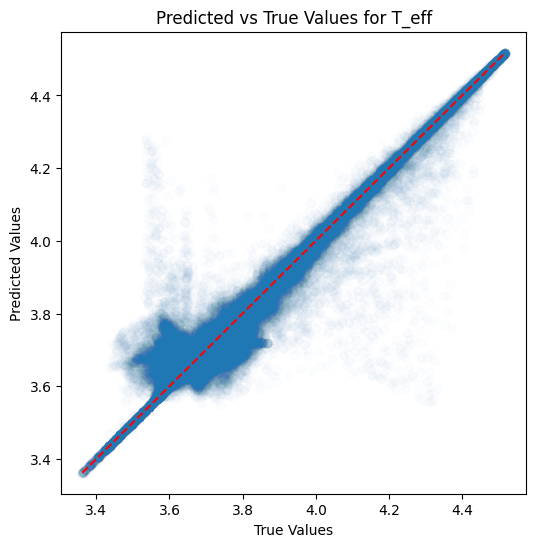

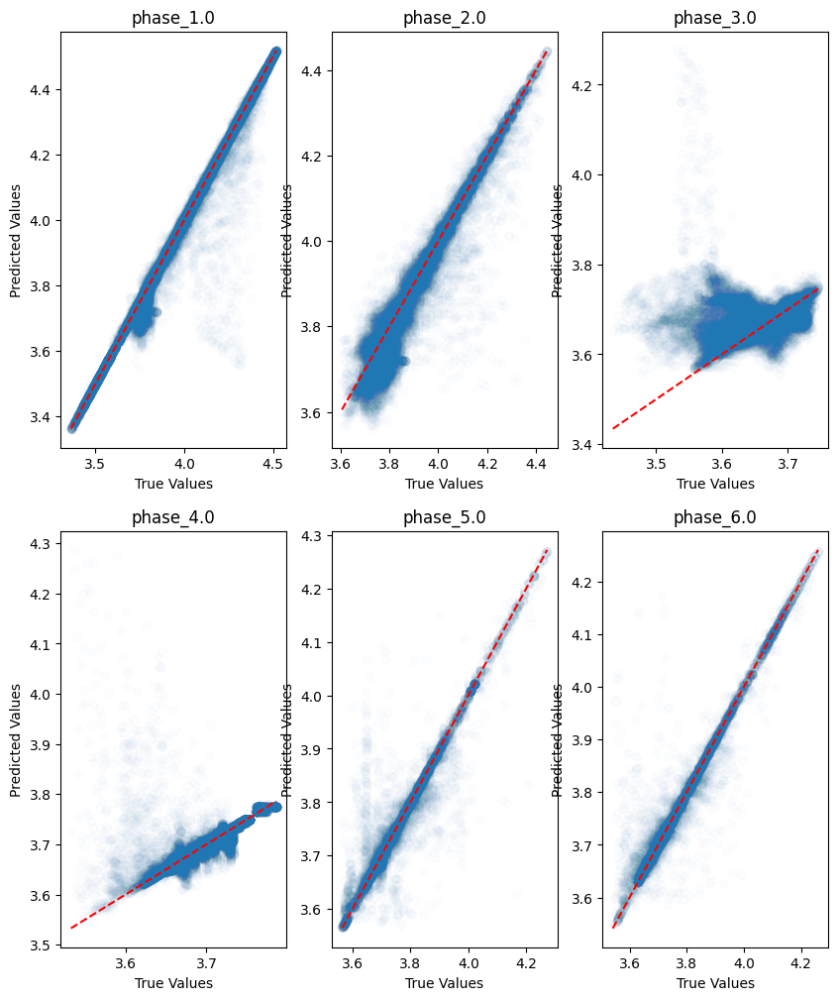

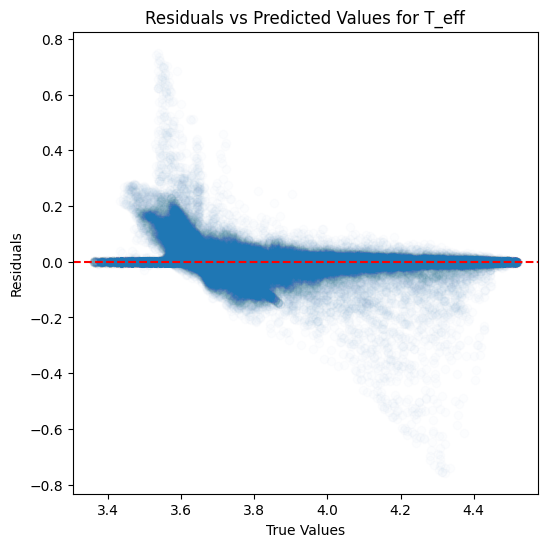

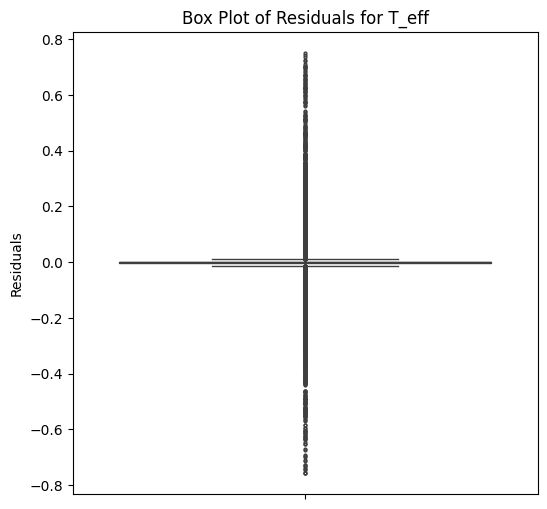

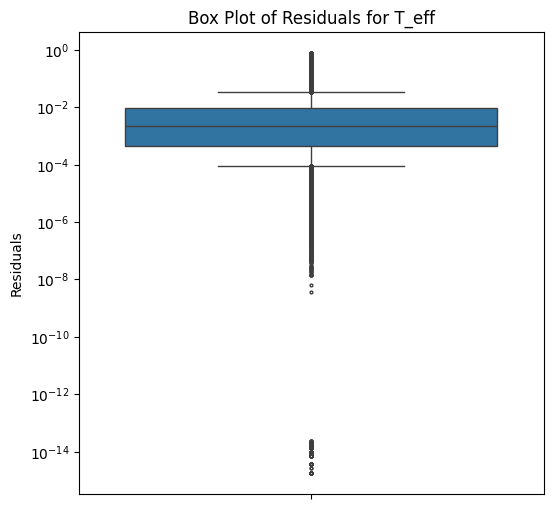

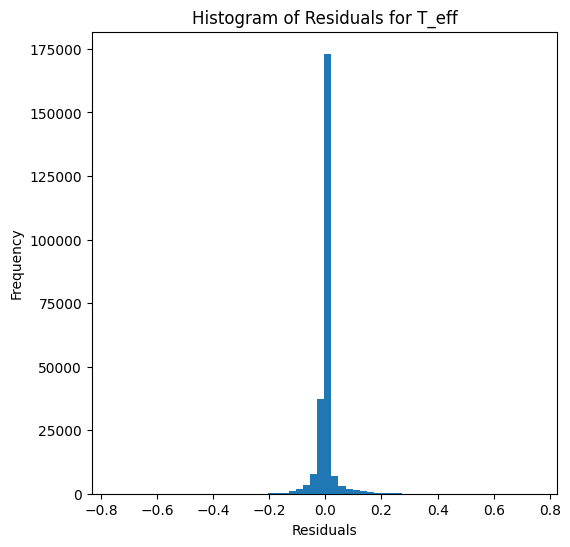

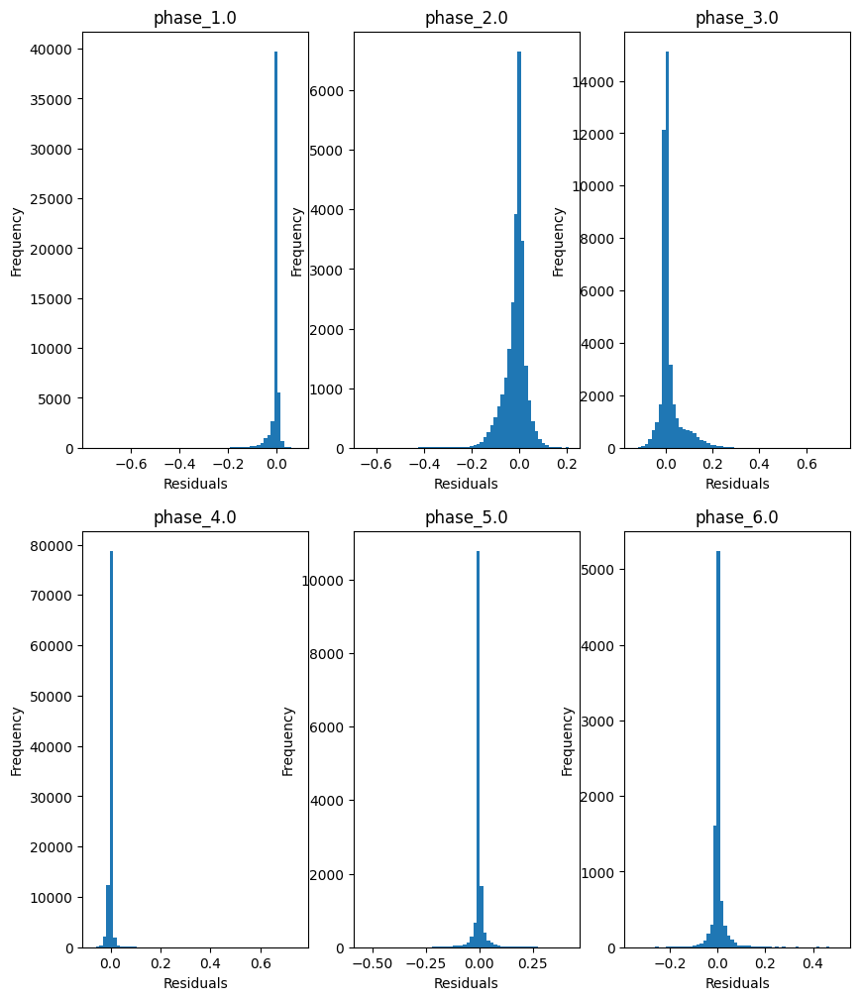

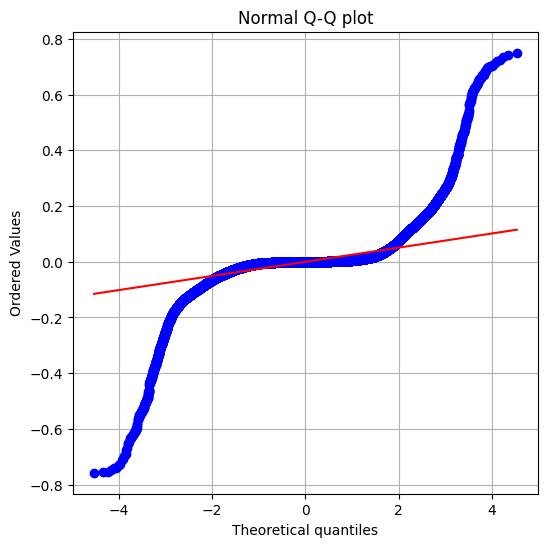

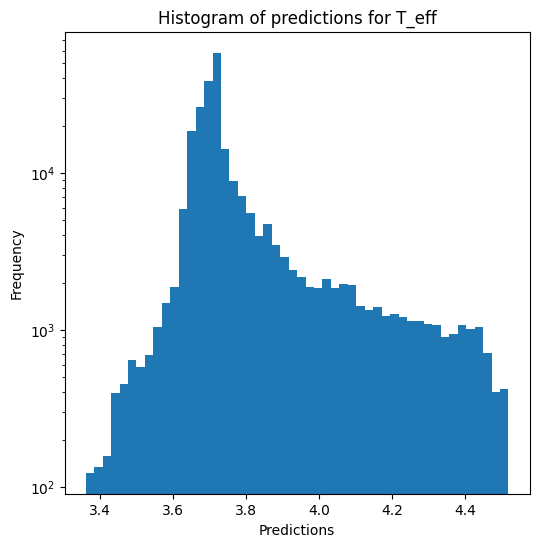

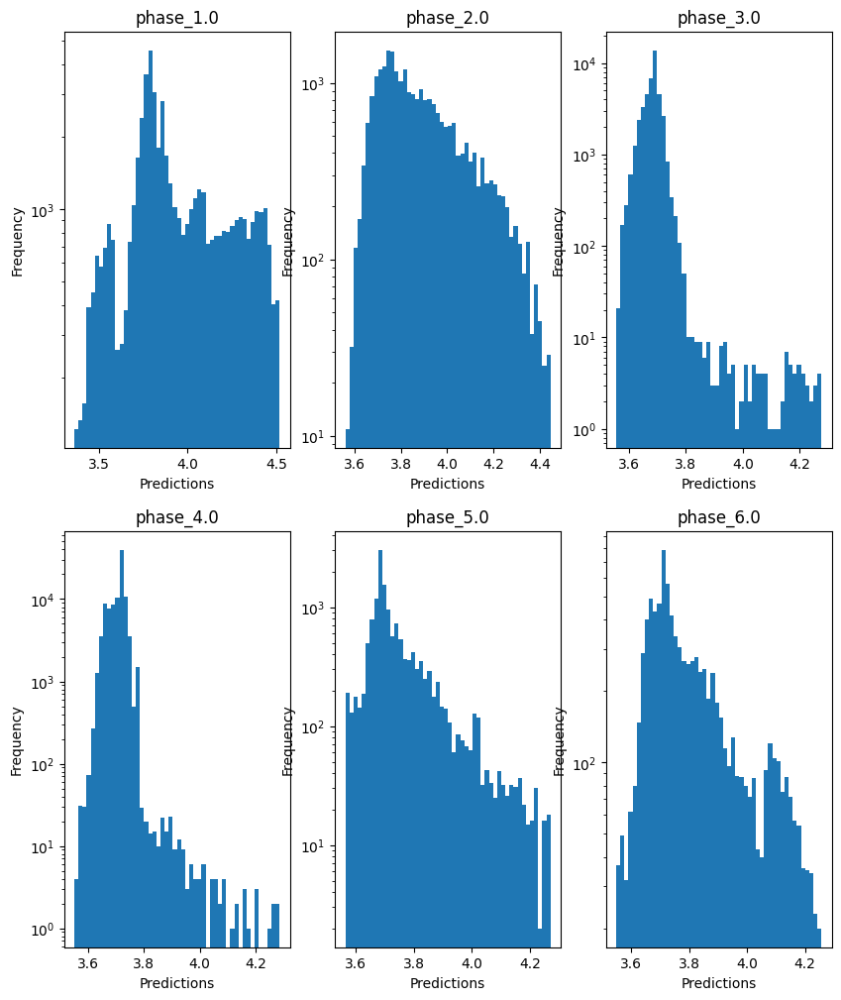


log_g results for the phase category with a value of 1.0
  value range :  3.233 - 5.345
  RVE :  0.35502526405149326
  RMSE :  0.2830122914092084
  MAE :  0.08229590181268803
  MedAE :  0.004809260419859296
  CORR :  0.8182668010038141
  MAX_ER :  3.5200367927569083
  Percentiles : 
    75th percentile :  0.02118128379821227
    90th percentile :  0.16481160650394622
    95th percentile :  0.5345611518678841
    99th percentile :  1.545063979398626

log_g results for the phase category with a value of 2.0
  value range :  0.638 - 4.299
  RVE :  0.6341818687502396
  RMSE :  0.5299108141099231
  MAE :  0.2731421398744131
  MedAE :  0.07466399910643073
  CORR :  0.8095551601154314
  MAX_ER :  3.004970678325158
  Percentiles : 
    75th percentile :  0.2326365030218054
    90th percentile :  1.0028597707788451
    95th percentile :  1.3782445024823413
    99th percentile :  1.945916186166368

log_g results for the phase category with a value of 3.0
  value range :  -0.384 - 3.823
  RVE : 

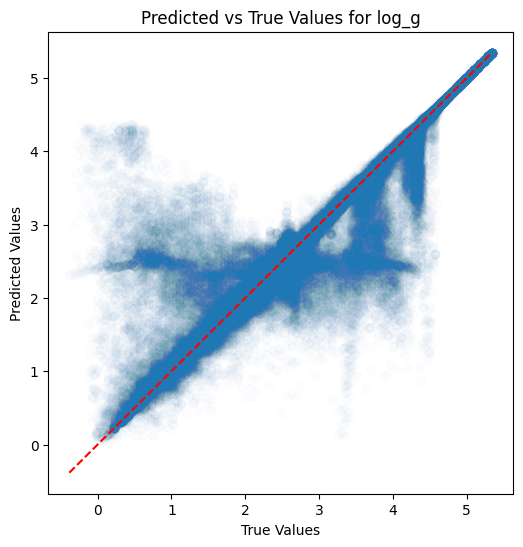

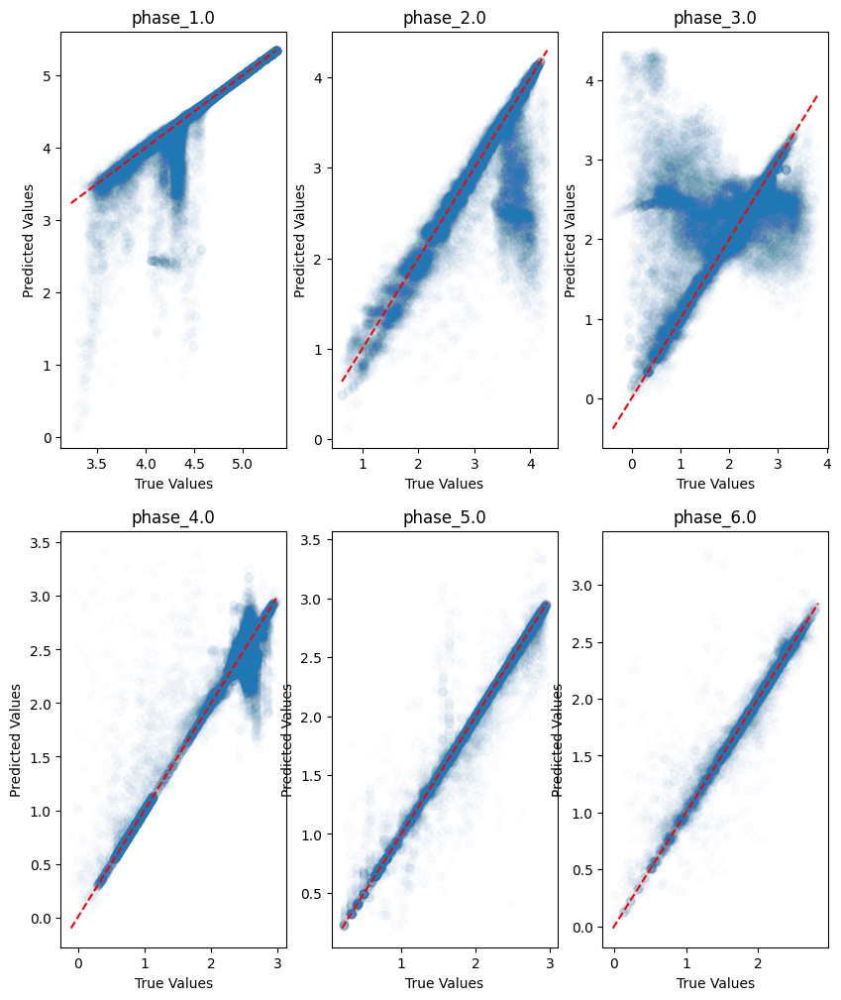

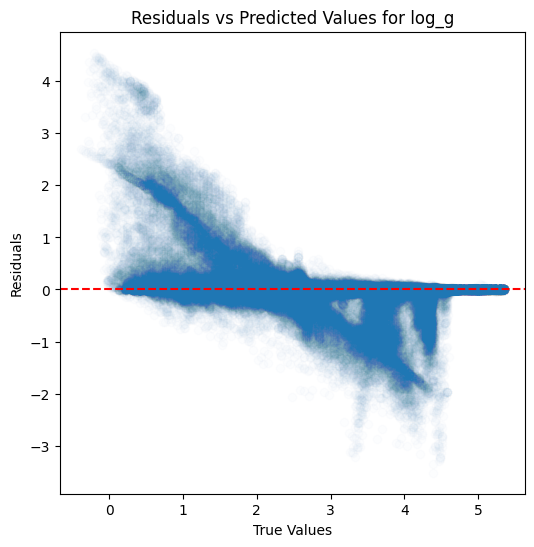

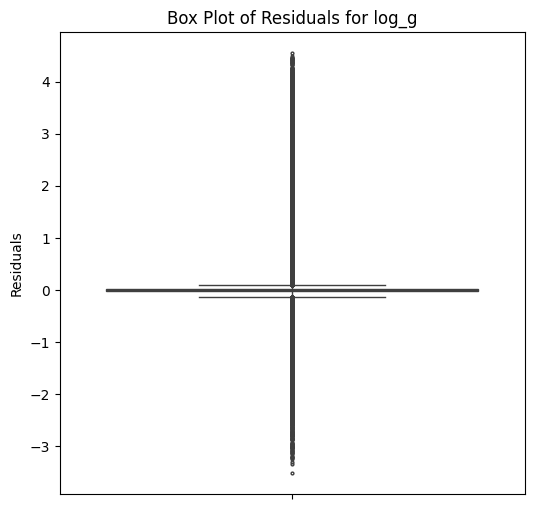

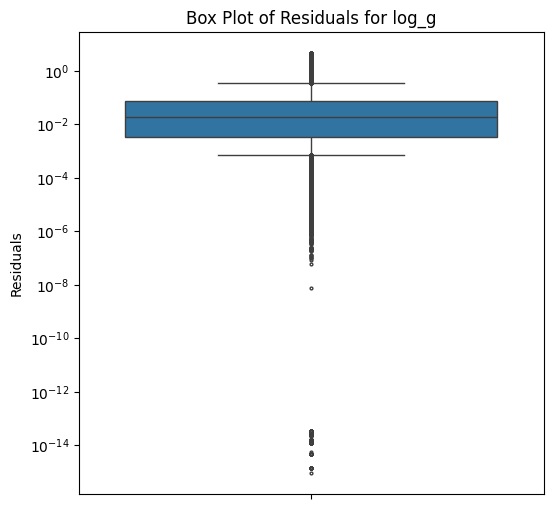

...

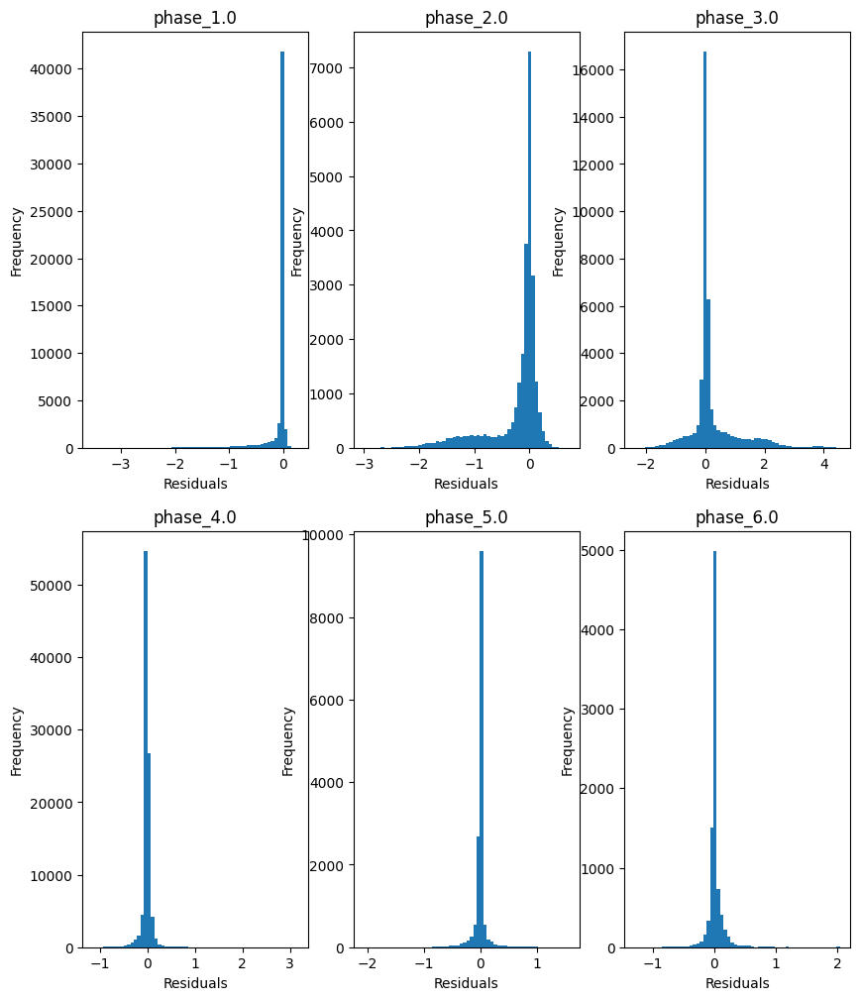

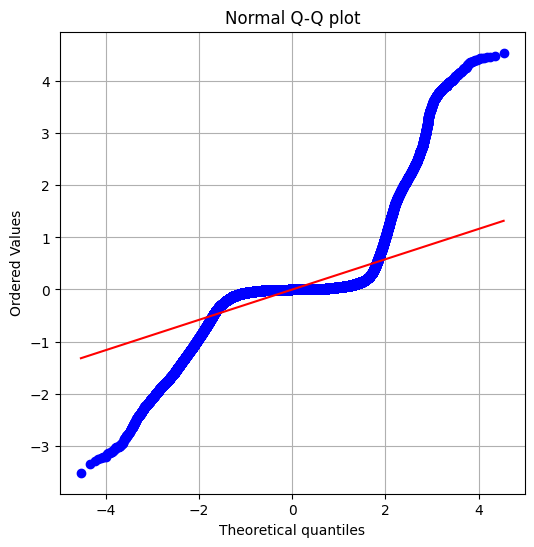

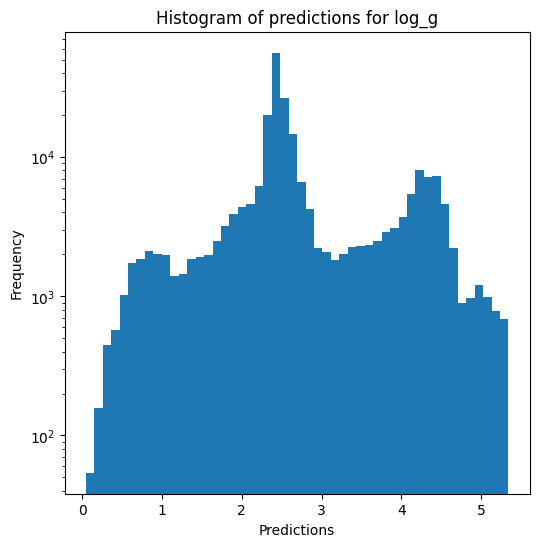

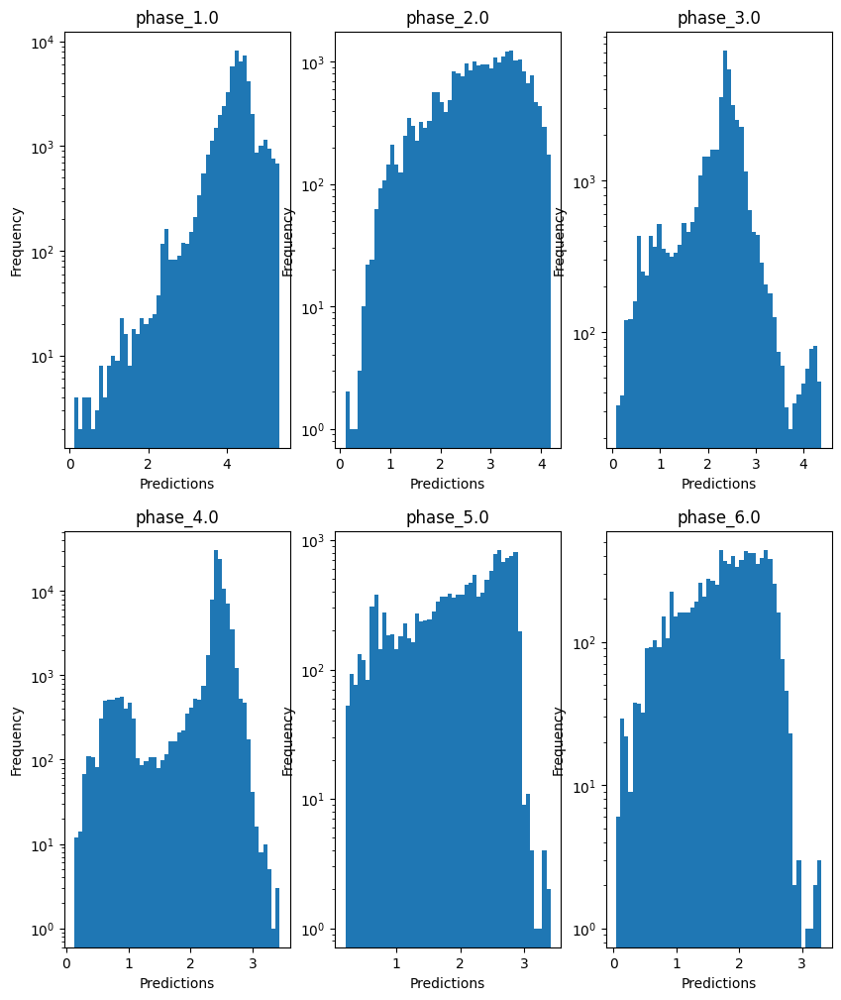

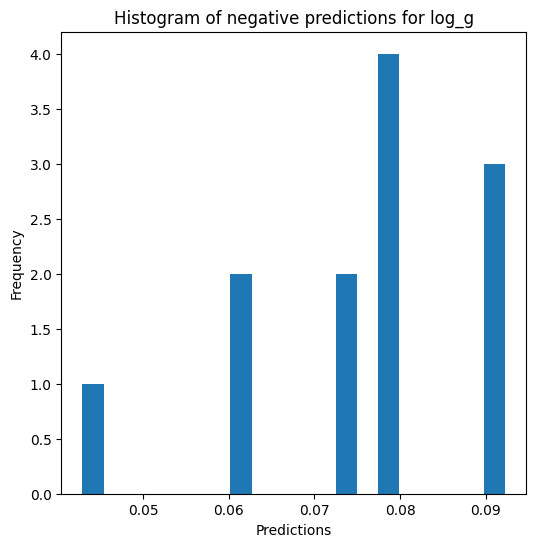


radius results for the phase category with a value of 1.0
  value range :  -0.9763360818022064 - 1.1687920203141815
  RVE :  0.8606115021982459
  RMSE :  0.141866697446379
  MAE :  0.042282508975996974
  MedAE :  0.0031129900049625125
  CORR :  0.9387159949124251
  MAX_ER :  1.7592591305504566
  Percentiles : 
    75th percentile :  0.013143705488114029
    90th percentile :  0.08429678726448062
    95th percentile :  0.2673119084244151
    99th percentile :  0.7725755318585941

radius results for the phase category with a value of 2.0
  value range :  0.0199466816788423 - 2.458486763798206
  RVE :  0.8005940144469238
  RMSE :  0.26497384709561467
  MAE :  0.13662227928242837
  MedAE :  0.037390002197768224
  CORR :  0.8947664198577598
  MAX_ER :  1.4999462448976735
  Percentiles : 
    75th percentile :  0.11626629636674174
    90th percentile :  0.5014505982355224
    95th percentile :  0.6890564156709482
    99th percentile :  0.9730549021622366

radius results for the phase catego

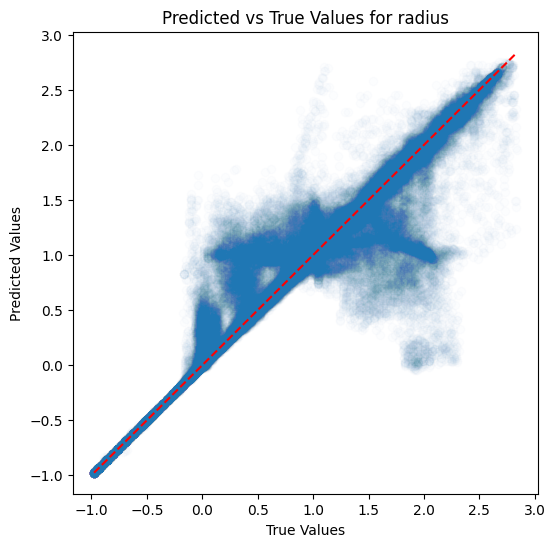

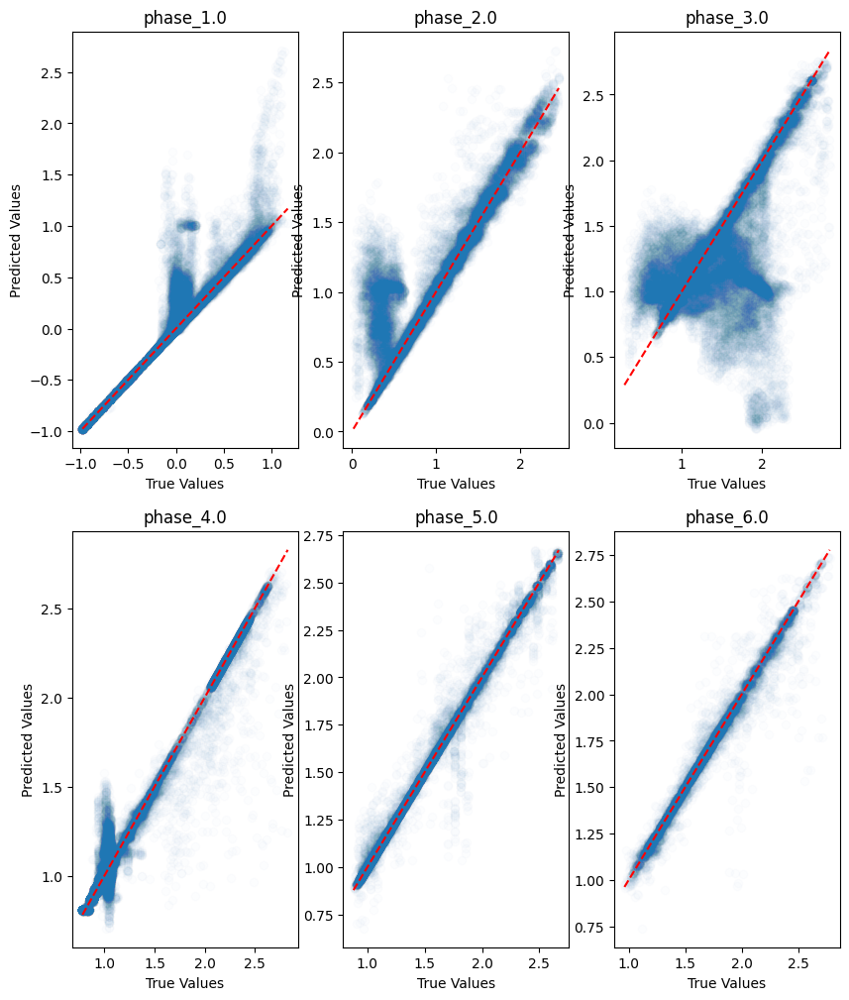

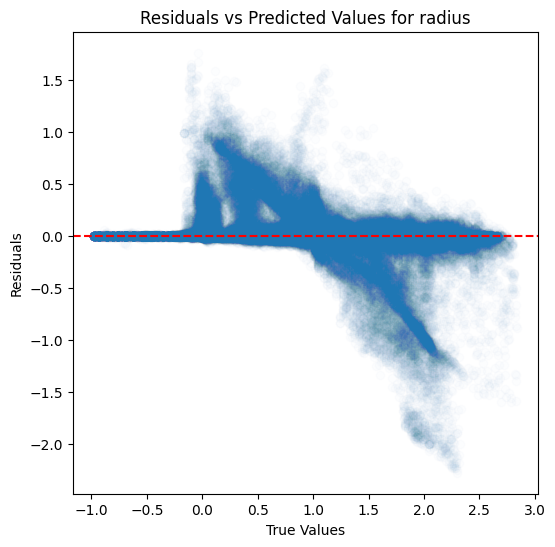

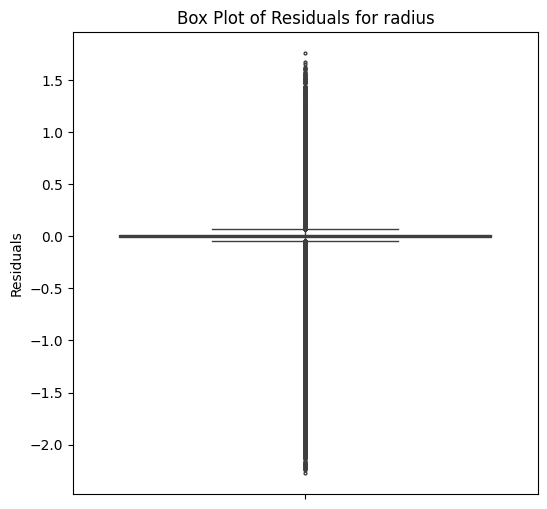

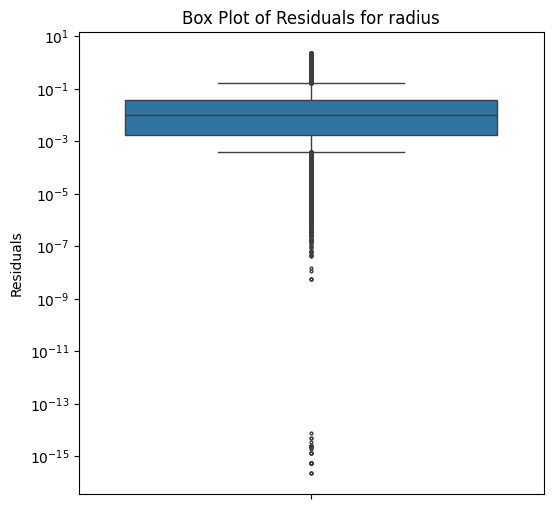

...

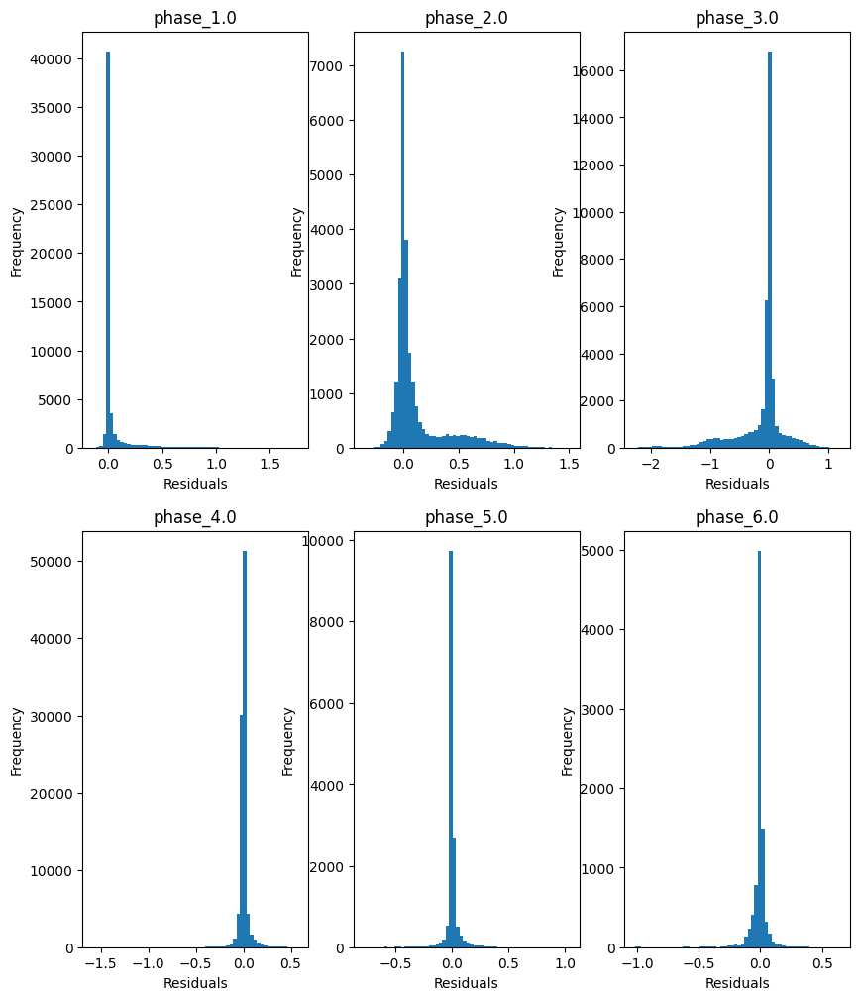

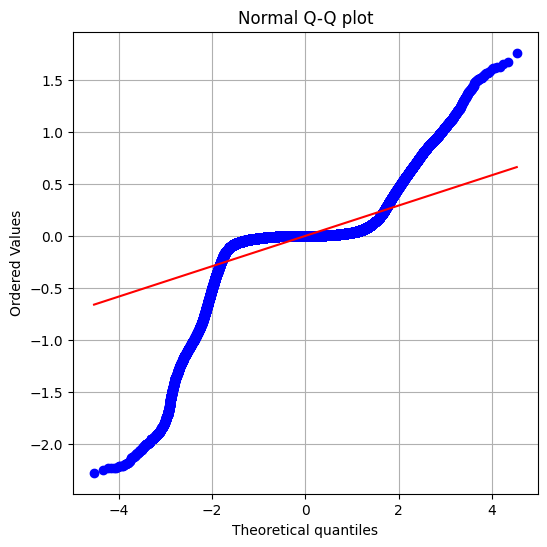

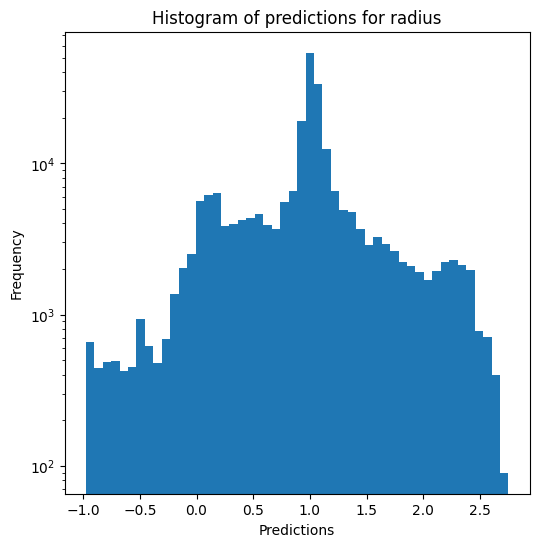

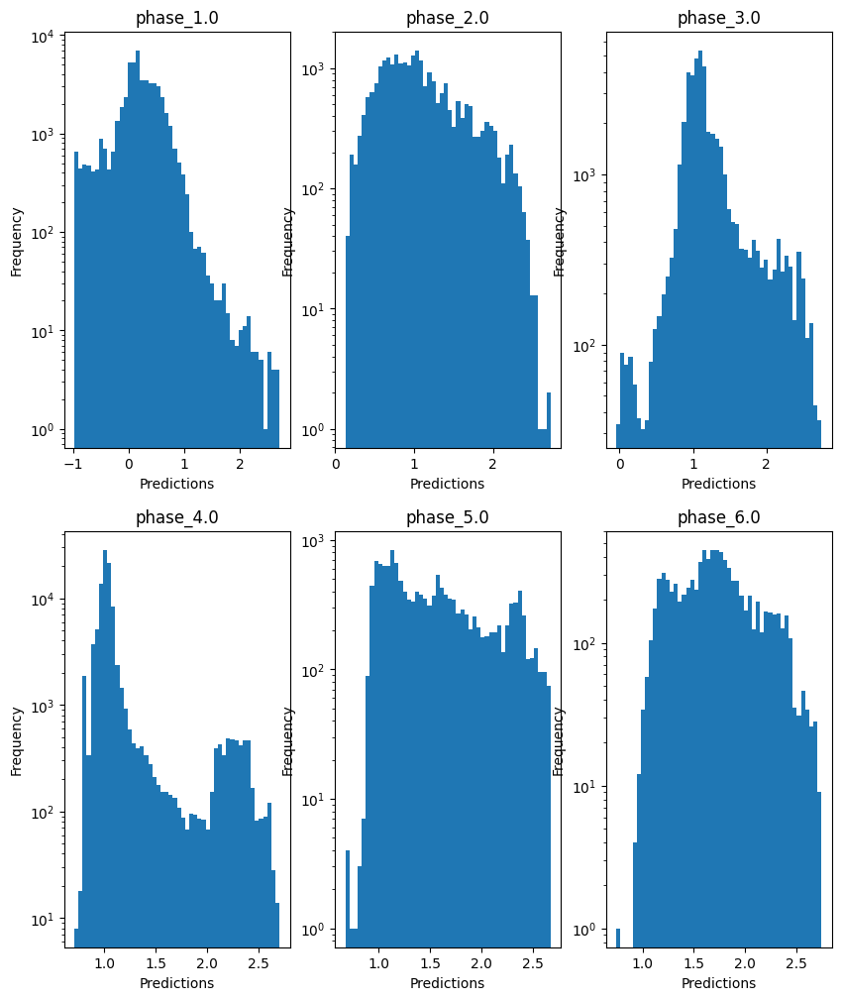

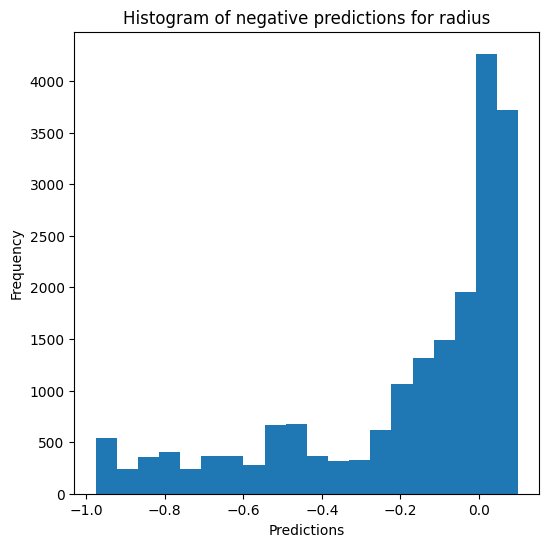

Saving predictions and results...


In [43]:
best_params_RF = {'n_jobs':10, 'n_estimators': 300, 'criterion': 'friedman_mse', 'max_depth': 50, 'min_samples_leaf': 3, 'min_samples_split': 10, 'max_features': None, 'max_leaf_nodes': None}

print(path_to_results)
dt_evaluator = Model_evaluator("random_forest", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)
dt_evaluator.evaluate_Kfold_results(RandomForestRegressor, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, random_state=12, override=override, use_preds=use_preds, save=save, show=show, scaler_name="quantile", **best_params_RF)

### K nearest neighbours

In [38]:
tag = "scale_power"

#### Testing the uniform weights with brute strength

In [26]:
cv_params = {'n_neighbors' : [5, 10, 20, 30, 50],
             'weights' : ["uniform"],
             'algorithm' : ["brute"]
            }

gscv_knn = GridSearchCV(KNeighborsRegressor(n_jobs = 10,
                                             ),
                         param_grid = cv_params,
                         scoring = scoring,
                         cv = 10,
                         verbose = 2,
                         refit="neg_root_mean_squared_error"
)

gscv_knn.fit(X_train_power, y_train)
display_grid_search(gscv_knn)

Fitting 10 folds for each of 5 candidates, totalling 50 fits
[CV] END ....algorithm=brute, n_neighbors=5, weights=uniform; total time=   4.0s
[CV] END ....algorithm=brute, n_neighbors=5, weights=uniform; total time=   1.5s
[CV] END ....algorithm=brute, n_neighbors=5, weights=uniform; total time=   1.5s
[CV] END ....algorithm=brute, n_neighbors=5, weights=uniform; total time=   1.5s
[CV] END ....algorithm=brute, n_neighbors=5, weights=uniform; total time=   1.5s
[CV] END ....algorithm=brute, n_neighbors=5, weights=uniform; total time=   1.5s
[CV] END ....algorithm=brute, n_neighbors=5, weights=uniform; total time=   1.5s
[CV] END ....algorithm=brute, n_neighbors=5, weights=uniform; total time=   1.5s
[CV] END ....algorithm=brute, n_neighbors=5, weights=uniform; total time=   1.5s
[CV] END ....algorithm=brute, n_neighbors=5, weights=uniform; total time=   1.5s
[CV] END ...algorithm=brute, n_neighbors=10, weights=uniform; total time=   1.5s
[CV] END ...algorithm=brute, n_neighbors=10, wei

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_algorithm,param_n_neighbors,param_weights,params,split0_test_neg_root_mean_squared_error,split1_test_neg_root_mean_squared_error,split2_test_neg_root_mean_squared_error,split3_test_neg_root_mean_squared_error,split4_test_neg_root_mean_squared_error,split5_test_neg_root_mean_squared_error,split6_test_neg_root_mean_squared_error,split7_test_neg_root_mean_squared_error,split8_test_neg_root_mean_squared_error,split9_test_neg_root_mean_squared_error,mean_test_neg_root_mean_squared_error,std_test_neg_root_mean_squared_error,rank_test_neg_root_mean_squared_error,split0_test_neg_mean_absolute_error,split1_test_neg_mean_absolute_error,split2_test_neg_mean_absolute_error,split3_test_neg_mean_absolute_error,split4_test_neg_mean_absolute_error,split5_test_neg_mean_absolute_error,split6_test_neg_mean_absolute_error,split7_test_neg_mean_absolute_error,split8_test_neg_mean_absolute_error,split9_test_neg_mean_absolute_error,mean_test_neg_mean_absolute_error,std_test_neg_mean_absolute_error,rank_test_neg_mean_absolute_error
0,0.007771,0.002510,1.842551,0.749568,brute,5,uniform,"{'algorithm': 'brute', 'n_neighbors': 5, 'weig...",-0.234004,-0.235374,-0.240281,-0.239229,-0.242379,-0.233632,-0.239086,-0.237276,-0.238961,-0.235469,-0.237569,0.002739,2,-0.082349,-0.082516,-0.083568,-0.084316,-0.085348,-0.083553,-0.084062,-0.084235,-0.083970,-0.084326,-0.083824,0.000842,1
1,0.006412,0.001479,1.584738,0.025029,brute,10,uniform,"{'algorithm': 'brute', 'n_neighbors': 10, 'wei...",-0.230392,-0.231608,-0.236698,-0.234064,-0.238403,-0.229930,-0.235001,-0.233484,-0.234389,-0.232387,-0.233636,0.002543,1,-0.087920,-0.088229,-0.089098,-0.089248,-0.091000,-0.088832,-0.089530,-0.089664,-0.089355,-0.090220,-0.089310,0.000851,2
2,0.006657,0.000672,1.609004,0.026009,brute,20,uniform,"{'algorithm': 'brute', 'n_neighbors': 20, 'wei...",-0.243473,-0.243556,-0.249345,-0.244150,-0.250485,-0.243548,-0.247368,-0.247494,-0.246999,-0.244541,-0.246096,0.002454,3,-0.104448,-0.104534,-0.105995,-0.104674,-0.107795,-0.105557,-0.105935,-0.106625,-0.106276,-0.106509,-0.105835,0.001010,3
3,0.006585,0.001591,1.608716,0.016386,brute,30,uniform,"{'algorithm': 'brute', 'n_neighbors': 30, 'wei...",-0.263405,-0.263104,-0.268216,-0.262017,-0.270023,-0.263364,-0.266642,-0.267247,-0.267021,-0.265312,-0.265635,0.002474,4,-0.122504,-0.122557,-0.124031,-0.122113,-0.126459,-0.123686,-0.123986,-0.125154,-0.124639,-0.125132,-0.124026,0.001306,4
4,0.008077,0.001201,1.664481,0.025633,brute,50,uniform,"{'algorithm': 'brute', 'n_neighbors': 50, 'wei...",-0.308575,-0.308208,-0.312255,-0.305853,-0.316113,-0.307155,-0.310560,-0.311794,-0.311774,-0.311487,-0.310378,0.002836,5,-0.157771,-0.157797,-0.159263,-0.156643,-0.162380,-0.158597,-0.158813,-0.160691,-0.159947,-0.161081,-0.159298,0.001655,5


Best parameters {'algorithm': 'brute', 'n_neighbors': 10, 'weights': 'uniform'}
Best score -0.23363580616874113


#### Testing the uniform weights with algorithms

In [27]:
cv_params = {'n_neighbors' : [5, 10, 20, 30, 50],
             'weights' : ["uniform"],
             'algorithm' : ["ball_tree", "kd_tree"],
             'leaf_size' : [15, 30, 50, 75, 100]
            }

gscv_knn = GridSearchCV(KNeighborsRegressor(n_jobs = 10,
                                             ),
                         param_grid = cv_params,
                         scoring = scoring,
                         cv = 10,
                         verbose = 2,
                         refit="neg_root_mean_squared_error"
)

gscv_knn.fit(X_train_power, y_train)
display_grid_search(gscv_knn)

Fitting 10 folds for each of 50 candidates, totalling 500 fits
[CV] END algorithm=ball_tree, leaf_size=15, n_neighbors=5, weights=uniform; total time=   0.8s
[CV] END algorithm=ball_tree, leaf_size=15, n_neighbors=5, weights=uniform; total time=   0.7s
[CV] END algorithm=ball_tree, leaf_size=15, n_neighbors=5, weights=uniform; total time=   0.8s
[CV] END algorithm=ball_tree, leaf_size=15, n_neighbors=5, weights=uniform; total time=   0.7s
[CV] END algorithm=ball_tree, leaf_size=15, n_neighbors=5, weights=uniform; total time=   0.8s
[CV] END algorithm=ball_tree, leaf_size=15, n_neighbors=5, weights=uniform; total time=   0.8s
[CV] END algorithm=ball_tree, leaf_size=15, n_neighbors=5, weights=uniform; total time=   0.8s
[CV] END algorithm=ball_tree, leaf_size=15, n_neighbors=5, weights=uniform; total time=   0.8s
[CV] END algorithm=ball_tree, leaf_size=15, n_neighbors=5, weights=uniform; total time=   0.8s
[CV] END algorithm=ball_tree, leaf_size=15, n_neighbors=5, weights=uniform; total 

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_algorithm,param_leaf_size,param_n_neighbors,param_weights,params,split0_test_neg_root_mean_squared_error,split1_test_neg_root_mean_squared_error,split2_test_neg_root_mean_squared_error,split3_test_neg_root_mean_squared_error,split4_test_neg_root_mean_squared_error,split5_test_neg_root_mean_squared_error,split6_test_neg_root_mean_squared_error,split7_test_neg_root_mean_squared_error,split8_test_neg_root_mean_squared_error,split9_test_neg_root_mean_squared_error,mean_test_neg_root_mean_squared_error,std_test_neg_root_mean_squared_error,rank_test_neg_root_mean_squared_error,split0_test_neg_mean_absolute_error,split1_test_neg_mean_absolute_error,split2_test_neg_mean_absolute_error,split3_test_neg_mean_absolute_error,split4_test_neg_mean_absolute_error,split5_test_neg_mean_absolute_error,split6_test_neg_mean_absolute_error,split7_test_neg_mean_absolute_error,split8_test_neg_mean_absolute_error,split9_test_neg_mean_absolute_error,mean_test_neg_mean_absolute_error,std_test_neg_mean_absolute_error,rank_test_neg_mean_absolute_error
0,0.122083,0.005768,0.738211,0.037249,ball_tree,15,5,uniform,"{'algorithm': 'ball_tree', 'leaf_size': 15, 'n...",-0.234063,-0.235117,-0.241103,-0.238968,-0.242049,-0.233622,-0.238937,-0.237243,-0.238760,-0.235388,-0.237525,0.002766,11,-0.082627,-0.082429,-0.083772,-0.084199,-0.085059,-0.083282,-0.084093,-0.084086,-0.083951,-0.084317,-0.083782,0.000757,1
1,0.129433,0.018523,0.796494,0.040067,ball_tree,15,10,uniform,"{'algorithm': 'ball_tree', 'leaf_size': 15, 'n...",-0.230241,-0.231638,-0.237085,-0.234143,-0.238539,-0.230089,-0.234994,-0.233612,-0.234017,-0.232225,-0.233658,0.002613,5,-0.087898,-0.088275,-0.089211,-0.089232,-0.091047,-0.088888,-0.089432,-0.089773,-0.089309,-0.090008,-0.089307,0.000836,15
2,0.121546,0.012210,0.904042,0.057718,ball_tree,15,20,uniform,"{'algorithm': 'ball_tree', 'leaf_size': 15, 'n...",-0.243476,-0.243430,-0.249404,-0.243954,-0.250354,-0.243615,-0.247423,-0.247451,-0.246817,-0.244567,-0.246049,0.002454,21,-0.104468,-0.104474,-0.106019,-0.104582,-0.107742,-0.105604,-0.105961,-0.106633,-0.106238,-0.106480,-0.105820,0.001012,21
3,0.118906,0.007145,0.987090,0.036043,ball_tree,15,30,uniform,"{'algorithm': 'ball_tree', 'leaf_size': 15, 'n...",-0.263537,-0.263071,-0.268154,-0.262007,-0.270048,-0.263334,-0.266655,-0.267362,-0.267004,-0.265358,-0.265653,0.002474,35,-0.122513,-0.122521,-0.124008,-0.122068,-0.126437,-0.123673,-0.123992,-0.125153,-0.124651,-0.125147,-0.124016,0.001313,35
4,0.128737,0.007511,1.123365,0.045423,ball_tree,15,50,uniform,"{'algorithm': 'ball_tree', 'leaf_size': 15, 'n...",-0.308592,-0.308236,-0.312299,-0.305797,-0.316184,-0.307169,-0.310543,-0.311833,-0.311786,-0.311538,-0.310398,0.002862,50,-0.157733,-0.157863,-0.159308,-0.156636,-0.162376,-0.158605,-0.158845,-0.160694,-0.160000,-0.161117,-0.159318,0.001658,43
5,0.107681,0.003990,0.928399,0.065651,ball_tree,30,5,uniform,"{'algorithm': 'ball_tree', 'leaf_size': 30, 'n...",-0.234193,-0.235587,-0.241037,-0.239368,-0.242288,-0.233864,-0.238887,-0.237246,-0.238565,-0.235392,-0.237643,0.002722,13,-0.082636,-0.082761,-0.083703,-0.084415,-0.084991,-0.083385,-0.084057,-0.084265,-0.083795,-0.084188,-0.083820,0.000696,3
6,0.110914,0.003794,0.971849,0.058636,ball_tree,30,10,uniform,"{'algorithm': 'ball_tree', 'leaf_size': 30, 'n...",-0.230385,-0.231555,-0.237017,-0.234287,-0.238164,-0.230299,-0.234969,-0.233741,-0.233791,-0.232254,-0.233646,0.002492,3,-0.088033,-0.088321,-0.089236,-0.089163,-0.090850,-0.089029,-0.089497,-0.089814,-0.089091,-0.090045,-0.089308,0.000772,16
7,0.114422,0.008137,1.071351,0.060396,ball_tree,30,20,uniform,"{'algorithm': 'ball_tree', 'leaf_size': 30, 'n...",-0.243422,-0.243406,-0.249298,-0.244059,-0.250267,-0.243635,-0.247447,-0.247488,-0.246897,-0.244599,-0.246052,0.002426,22,-0.104507,-0.104435,-0.105998,-0.104592,-0.107781,-0.105606,-0.106000,-0.106613,-0.106311,-0.106578,-0.105842,0.001027,22
8,0.115183,0.005847,1.170312,0.079403,

Best parameters {'algorithm': 'ball_tree', 'leaf_size': 75, 'n_neighbors': 10, 'weights': 'uniform'}
Best score -0.23363571814991993


the algorithms give almost the same results then brute force with much less time. It is better to use them with distance calculation

#### Testing the distance weights with algorithms

In [28]:
cv_params = {'n_neighbors' : [5, 25, 50],
             'weights' : ["distance"],
             'algorithm' : ["ball_tree", "kd_tree"],
             'leaf_size' : [15, 50, 100],
             'p' : [1.0, 1.3, 1.6, 2.0]
            }

gscv_knn_1 = GridSearchCV(KNeighborsRegressor(n_jobs = 10,
                                             ),
                         param_grid = cv_params,
                         scoring = scoring,
                         cv = 10,
                         verbose = 2,
                         refit="neg_root_mean_squared_error"
)

gscv_knn_1.fit(X_train_power, y_train)
display_grid_search(gscv_knn_1)

Fitting 10 folds for each of 72 candidates, totalling 720 fits
[CV] END algorithm=ball_tree, leaf_size=15, n_neighbors=5, p=1.0, weights=distance; total time=   0.6s
[CV] END algorithm=ball_tree, leaf_size=15, n_neighbors=5, p=1.0, weights=distance; total time=   0.7s
[CV] END algorithm=ball_tree, leaf_size=15, n_neighbors=5, p=1.0, weights=distance; total time=   0.7s
[CV] END algorithm=ball_tree, leaf_size=15, n_neighbors=5, p=1.0, weights=distance; total time=   0.6s
[CV] END algorithm=ball_tree, leaf_size=15, n_neighbors=5, p=1.0, weights=distance; total time=   0.7s
[CV] END algorithm=ball_tree, leaf_size=15, n_neighbors=5, p=1.0, weights=distance; total time=   0.6s
[CV] END algorithm=ball_tree, leaf_size=15, n_neighbors=5, p=1.0, weights=distance; total time=   0.7s
[CV] END algorithm=ball_tree, leaf_size=15, n_neighbors=5, p=1.0, weights=distance; total time=   0.7s
[CV] END algorithm=ball_tree, leaf_size=15, n_neighbors=5, p=1.0, weights=distance; total time=   0.5s
[CV] END a

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_algorithm,param_leaf_size,param_n_neighbors,param_p,param_weights,params,split0_test_neg_root_mean_squared_error,split1_test_neg_root_mean_squared_error,split2_test_neg_root_mean_squared_error,split3_test_neg_root_mean_squared_error,split4_test_neg_root_mean_squared_error,split5_test_neg_root_mean_squared_error,split6_test_neg_root_mean_squared_error,split7_test_neg_root_mean_squared_error,split8_test_neg_root_mean_squared_error,split9_test_neg_root_mean_squared_error,mean_test_neg_root_mean_squared_error,std_test_neg_root_mean_squared_error,rank_test_neg_root_mean_squared_error,split0_test_neg_mean_absolute_error,split1_test_neg_mean_absolute_error,split2_test_neg_mean_absolute_error,split3_test_neg_mean_absolute_error,split4_test_neg_mean_absolute_error,split5_test_neg_mean_absolute_error,split6_test_neg_mean_absolute_error,split7_test_neg_mean_absolute_error,split8_test_neg_mean_absolute_error,split9_test_neg_mean_absolute_error,mean_test_neg_mean_absolute_error,std_test_neg_mean_absolute_error,rank_test_neg_mean_absolute_error
0,0.126586,0.004644,0.627197,0.070024,ball_tree,15,5,1.0,distance,"{'algorithm': 'ball_tree', 'leaf_size': 15, 'n...",-0.276793,-0.273961,-0.284180,-0.279818,-0.281107,-0.276518,-0.278820,-0.278202,-0.280402,-0.278593,-0.278839,0.002663,6,-0.088201,-0.087512,-0.089659,-0.089949,-0.090324,-0.089701,-0.090102,-0.089702,-0.089907,-0.090512,-0.089557,0.000903,12
1,0.261681,0.013679,1.090247,0.099765,ball_tree,15,5,1.3,distance,"{'algorithm': 'ball_tree', 'leaf_size': 15, 'n...",-0.276876,-0.273999,-0.284194,-0.279843,-0.281061,-0.276492,-0.278818,-0.278293,-0.280375,-0.278571,-0.278852,0.002648,12,-0.088227,-0.087505,-0.089668,-0.089972,-0.090317,-0.089684,-0.090082,-0.089742,-0.089899,-0.090483,-0.089558,0.000897,13
2,0.235744,0.009755,1.313828,0.095295,ball_tree,15,5,1.6,distance,"{'algorithm': 'ball_tree', 'leaf_size': 15, 'n...",-0.276861,-0.273991,-0.284184,-0.279792,-0.281059,-0.276511,-0.278815,-0.278340,-0.280375,-0.278657,-0.278858,0.002643,13,-0.088222,-0.087507,-0.089660,-0.089932,-0.090311,-0.089680,-0.090072,-0.089749,-0.089899,-0.090529,-0.089556,0.000899,11
3,0.120539,0.005698,0.802008,0.041456,ball_tree,15,5,2.0,distance,"{'algorithm': 'ball_tree', 'leaf_size': 15, 'n...",-0.276804,-0.273954,-0.284198,-0.279782,-0.281075,-0.276479,-0.278851,-0.278171,-0.280414,-0.278563,-0.278829,0.002668,2,-0.088197,-0.087489,-0.089660,-0.089941,-0.090299,-0.089675,-0.090083,-0.089691,-0.089922,-0.090491,-0.089545,0.000903,7
4,0.138620,0.015129,0.953544,0.103960,ball_tree,15,25,1.0,distance,"{'algorithm': 'ball_tree', 'leaf_size': 15, 'n...",-0.281842,-0.277773,-0.289152,-0.281558,-0.285043,-0.282111,-0.281793,-0.284201,-0.285367,-0.283043,-0.283188,0.002858,25,-0.099412,-0.098553,-0.101112,-0.100257,-0.101600,-0.101165,-0.100752,-0.101217,-0.101050,-0.101527,-0.100664,0.000934,34
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
67,0.136770,0.005470,0.216350,0.025057,kd_tree,100,25,2.0,distance,"{'algorithm': 'kd_tree', 'leaf_size': 100, 'n_...",-0.282043,-0.277969,-0.289238,-0.281999,-0.285327,-0.282460,-0.282077,-0.284474,-0.285689,-0.283142,-0.283442,0.002831,46,-0.099474,-0.098761,-0.101036,-0.100629,-0.101915,-0.101291,-0.100865,-0.101469,-0.101213,-0.101729,-0.100838,0.000946,45
68,0.153103,0.036548,0.363047,0.039186,kd_tree,100,50,1.0,distance,"{'algorithm': 'kd_tree', 'leaf_size': 100, 'n_...",-0.299087,-0.293966,-0.305454,-0.296956,-0.302335,-0.298449,-0.297753,-0.300682,-0.302316,-0.299692,-0.299669,0.003066,56,-0.114279,-0.112685,-0.115581,-0.114310,-0.116902,-0.115589,-0.115221,-0.115951,-0.115871,-0.116448,-0.115284,0.001169,59
69,0.131906,0.005864,0.465902,0.028981,kd_tree,100,50,1.3,distance,"{'algorithm': 'kd_tree', 'leaf_size': 100, 'n_...",-0.298734,-0.293801,-0.305286,-0.297085,-0.302494,-0.298336,-0.297583,-0.300592,-0.3020

Best parameters {'algorithm': 'kd_tree', 'leaf_size': 15, 'n_neighbors': 5, 'p': 2.0, 'weights': 'distance'}
Best score -0.27882900966154


In [29]:
cv_params = {'n_neighbors' : [5, 25, 50],
             'weights' : [gaussian],
             'algorithm' : ["ball_tree", "kd_tree"],
             'leaf_size' : [15, 50, 100]
            }

gscv_knn_2 = GridSearchCV(KNeighborsRegressor(n_jobs = 10,
                                             ),
                         param_grid = cv_params,
                         scoring = scoring,
                         cv = 10,
                         verbose = 2,
                         refit="neg_root_mean_squared_error"
)

gscv_knn_2.fit(X_train, y_train)
display_grid_search(gscv_knn_2)

Fitting 10 folds for each of 18 candidates, totalling 180 fits
[CV] END algorithm=ball_tree, leaf_size=15, n_neighbors=5, weights=<function gaussian at 0x0000029352B79300>; total time=   0.8s
[CV] END algorithm=ball_tree, leaf_size=15, n_neighbors=5, weights=<function gaussian at 0x0000029352B79300>; total time=   0.8s
[CV] END algorithm=ball_tree, leaf_size=15, n_neighbors=5, weights=<function gaussian at 0x0000029352B79300>; total time=   0.7s
[CV] END algorithm=ball_tree, leaf_size=15, n_neighbors=5, weights=<function gaussian at 0x0000029352B79300>; total time=   0.9s
[CV] END algorithm=ball_tree, leaf_size=15, n_neighbors=5, weights=<function gaussian at 0x0000029352B79300>; total time=   0.7s
[CV] END algorithm=ball_tree, leaf_size=15, n_neighbors=5, weights=<function gaussian at 0x0000029352B79300>; total time=   0.9s
[CV] END algorithm=ball_tree, leaf_size=15, n_neighbors=5, weights=<function gaussian at 0x0000029352B79300>; total time=   0.8s
[CV] END algorithm=ball_tree, leaf

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_algorithm,param_leaf_size,param_n_neighbors,param_weights,params,split0_test_neg_root_mean_squared_error,split1_test_neg_root_mean_squared_error,split2_test_neg_root_mean_squared_error,split3_test_neg_root_mean_squared_error,split4_test_neg_root_mean_squared_error,split5_test_neg_root_mean_squared_error,split6_test_neg_root_mean_squared_error,split7_test_neg_root_mean_squared_error,split8_test_neg_root_mean_squared_error,split9_test_neg_root_mean_squared_error,mean_test_neg_root_mean_squared_error,std_test_neg_root_mean_squared_error,rank_test_neg_root_mean_squared_error,split0_test_neg_mean_absolute_error,split1_test_neg_mean_absolute_error,split2_test_neg_mean_absolute_error,split3_test_neg_mean_absolute_error,split4_test_neg_mean_absolute_error,split5_test_neg_mean_absolute_error,split6_test_neg_mean_absolute_error,split7_test_neg_mean_absolute_error,split8_test_neg_mean_absolute_error,split9_test_neg_mean_absolute_error,mean_test_neg_mean_absolute_error,std_test_neg_mean_absolute_error,rank_test_neg_mean_absolute_error
0,0.127856,0.014911,0.787837,0.050367,ball_tree,15,5,<function gaussian at 0x0000029352B79300>,"{'algorithm': 'ball_tree', 'leaf_size': 15, 'n...",-0.250130,-0.248803,-0.254181,-0.253112,-0.258789,-0.246214,-0.253206,-0.249877,-0.251724,-0.246845,-0.251288,0.003561,4,-0.088724,-0.088005,-0.089540,-0.090368,-0.092097,-0.089151,-0.089792,-0.089374,-0.089765,-0.089438,-0.089625,0.001024,3
1,0.120787,0.003427,0.962230,0.051083,ball_tree,15,25,<function gaussian at 0x0000029352B79300>,"{'algorithm': 'ball_tree', 'leaf_size': 15, 'n...",-0.278449,-0.276691,-0.280386,-0.277158,-0.286180,-0.276449,-0.280797,-0.279683,-0.280625,-0.277144,-0.279356,0.002784,7,-0.125351,-0.125048,-0.125716,-0.125104,-0.129645,-0.125943,-0.126297,-0.127200,-0.126985,-0.127110,-0.126440,0.001315,7
2,0.130057,0.014895,1.223987,0.086767,ball_tree,15,50,<function gaussian at 0x0000029352B79300>,"{'algorithm': 'ball_tree', 'leaf_size': 15, 'n...",-0.331461,-0.330505,-0.333777,-0.329197,-0.338635,-0.330112,-0.333660,-0.331823,-0.335516,-0.333322,-0.332801,0.002676,13,-0.171495,-0.171456,-0.172646,-0.171022,-0.176277,-0.172921,-0.172883,-0.174004,-0.174290,-0.174946,-0.173194,0.001598,13
3,0.113304,0.006676,0.960785,0.063630,ball_tree,50,5,<function gaussian at 0x0000029352B79300>,"{'algorithm': 'ball_tree', 'leaf_size': 50, 'n...",-0.250066,-0.249282,-0.254362,-0.252802,-0.258541,-0.246235,-0.252709,-0.250228,-0.251546,-0.246637,-0.251241,0.003467,2,-0.088623,-0.088328,-0.089639,-0.090453,-0.092254,-0.089308,-0.089775,-0.089691,-0.089608,-0.089215,-0.089689,0.001026,5
4,0.113901,0.010206,1.256305,0.079975,ball_tree,50,25,<function gaussian at 0x0000029352B79300>,"{'algorithm': 'ball_tree', 'leaf_size': 50, 'n...",-0.278386,-0.276831,-0.280465,-0.277283,-0.286259,-0.276477,-0.280787,-0.279535,-0.280818,-0.276961,-0.279380,0.002806,9,-0.125313,-0.125115,-0.125684,-0.125116,-0.129657,-0.125979,-0.126358,-0.127220,-0.127075,-0.127033,-0.126455,0.001315,11
5,0.111567,0.004137,1.468415,0.119000,ball_tree,50,50,<function gaussian at 0x0000029352B79300>,"{'algorithm': 'ball_tree', 'leaf_size': 50, 'n...",-0.331499,-0.330586,-0.333872,-0.329200,-0.338578,-0.330229,-0.333713,-0.331818,-0.335553,-0.333270,-0.332832,0.002651,18,-0.171496,-0.171522,-0.172719,-0.171017,-0.176252,-0.172947,-0.172925,-0.173975,-0.174321,-0.174924,-0.173210,0.001581,15
6,0.101779,0.005425,1.316435,0.168942,ball_tree,100,5,<function gaussian at 0x0000029352B79300>,"{'algorithm': 'ball_tree', 'leaf_size': 100, '...",-0.250125,-0.248480,-0.254168,-0.252790,-0.258600,-0.246380,-0.252996,-0.250561,-0.251726,-0.246743,-0.251257,0.003488,3,-0.088559,-0.088218,-0.089405,-0.090298,-0.091859,-0.089104,-0.089644,-0.089676,-0.089456,-0.089262,-0.089548,0.000948,1
7,0.103933,0.008489,1.550992,0.122557,ball_tree,100,25,<function gaussian at 0x0000029352B79300>,"{'algorithm': 'ball_tree', 'leaf_size': 100, '...",-0.278497,-0.2

Best parameters {'algorithm': 'kd_tree', 'leaf_size': 50, 'n_neighbors': 5, 'weights': <function gaussian at 0x0000029352B79300>}
Best score -0.2511973721590466


#### Training the model with all the fine-tuned parameters and checking the results

../../../../../../results/model_B/fine_tuned_models/

scale_power train data :
Performing K-fold...
Split 1 2 3 4 5 6 7 8 9 10 
Evaluating predictions...
no negative values

T_eff results for the phase category with a value of 1.0
  value range :  3.3621 - 4.5177
  RVE :  0.9758224167933874
  RMSE :  0.04198385713182288
  MAE :  0.012087312473941554
  MedAE :  0.0025900000000000922
  CORR :  0.9878828146727695
  MAX_ER :  0.7723300000000006
  Percentiles : 
    75th percentile :  0.008849999999999802
    90th percentile :  0.024299999999999766
    95th percentile :  0.04212999999999967
    99th percentile :  0.15456799999999965

T_eff results for the phase category with a value of 2.0
  value range :  3.6053 - 4.446
  RVE :  0.9141601349076034
  RMSE :  0.062393068665753636
  MAE :  0.04490603843769374
  MedAE :  0.03390499999999985
  CORR :  0.9567721635531193
  MAX_ER :  0.6216500000000003
  Percentiles : 
    75th percentile :  0.062299999999999245
    90th percentile :  0.098163000

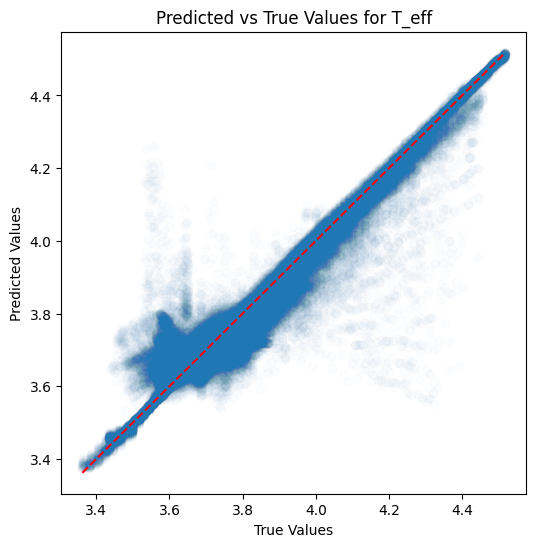

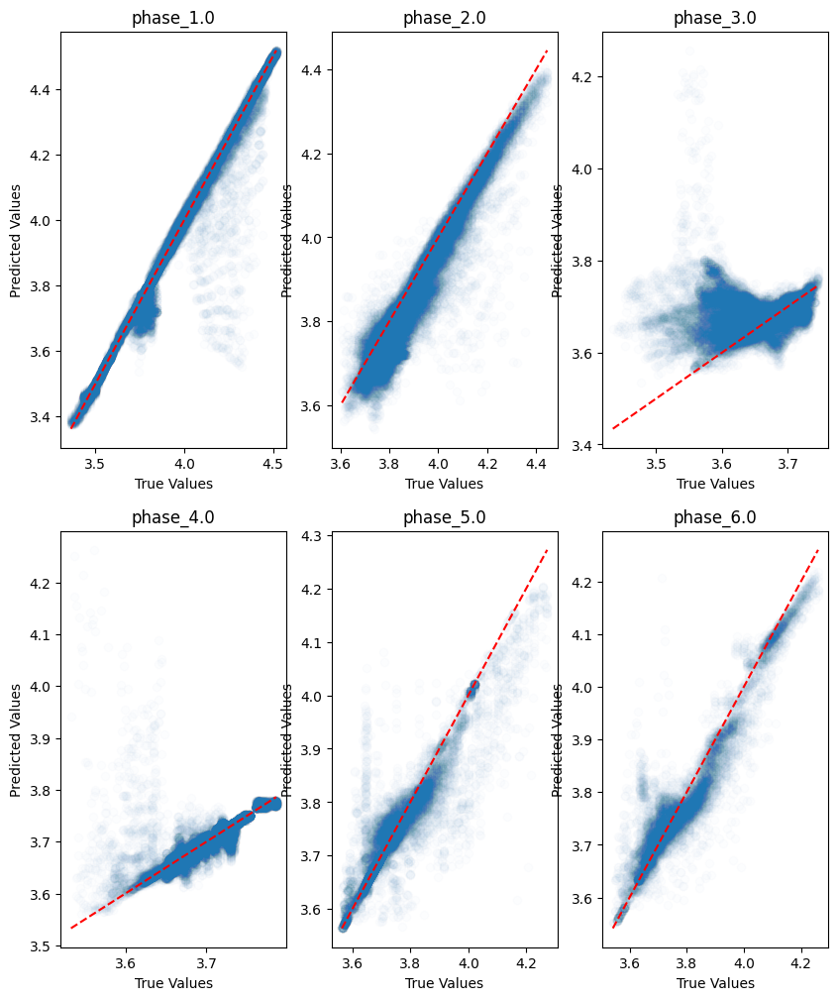

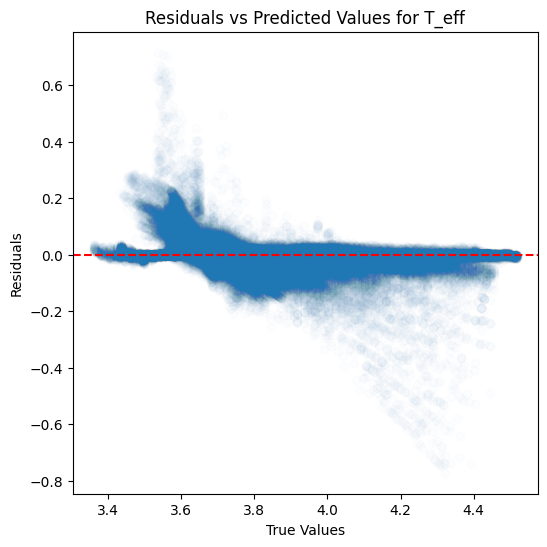

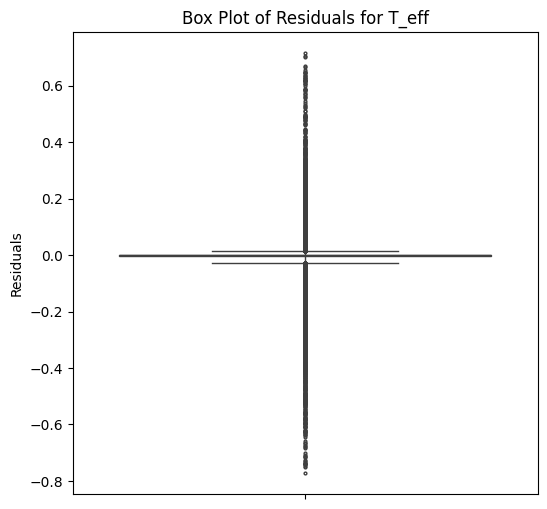

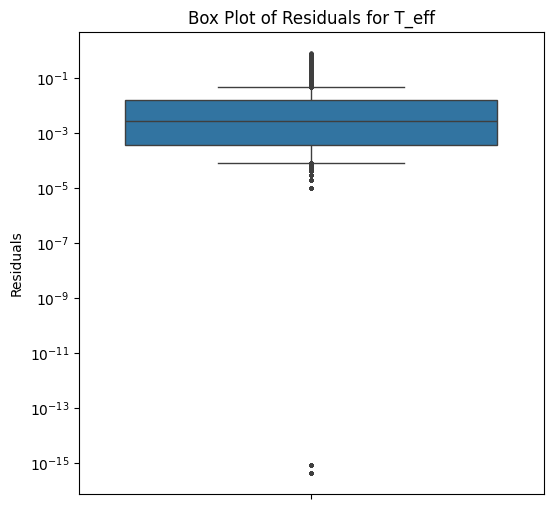

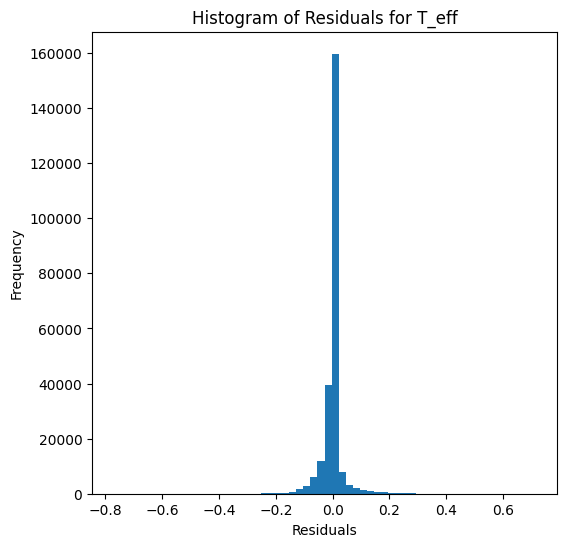

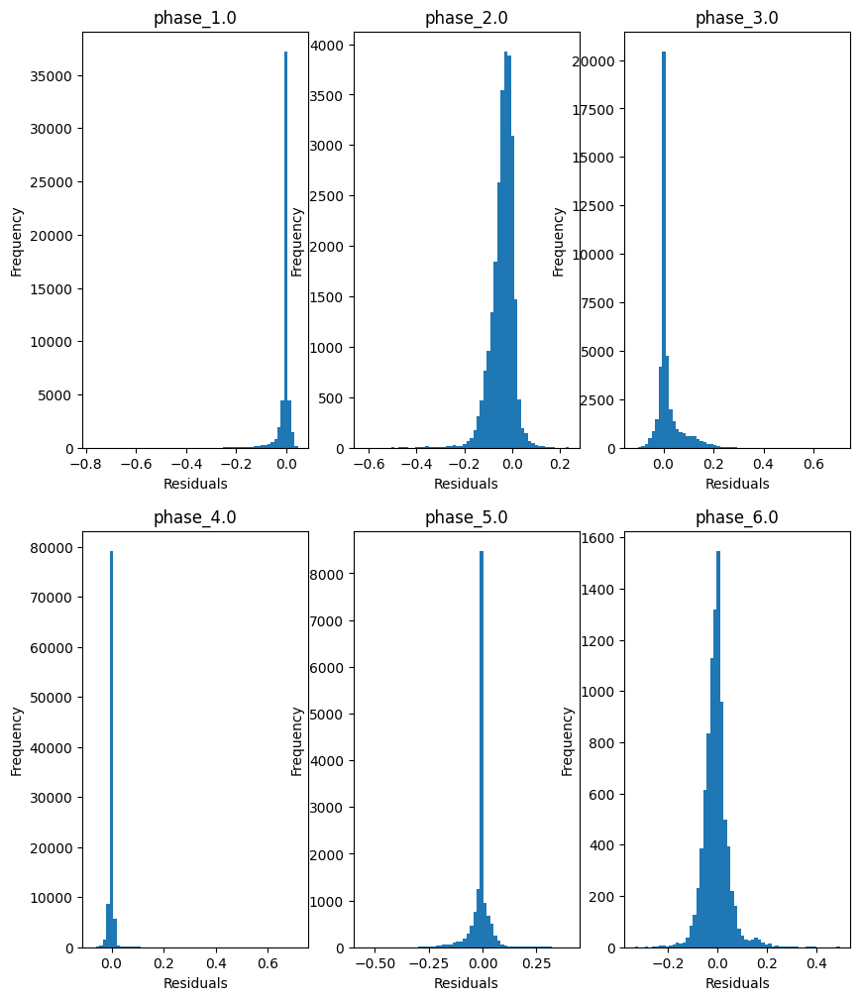

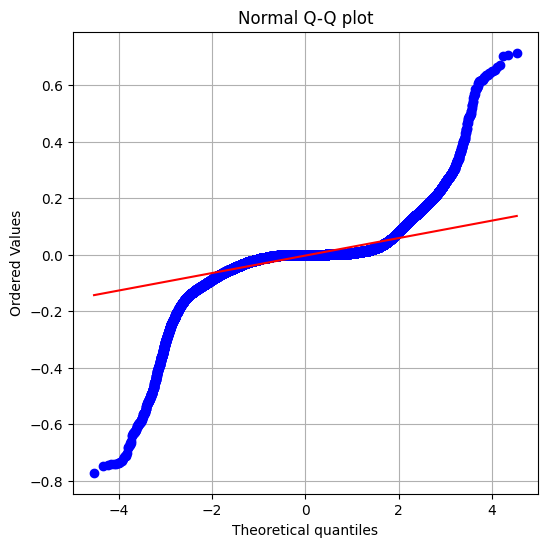

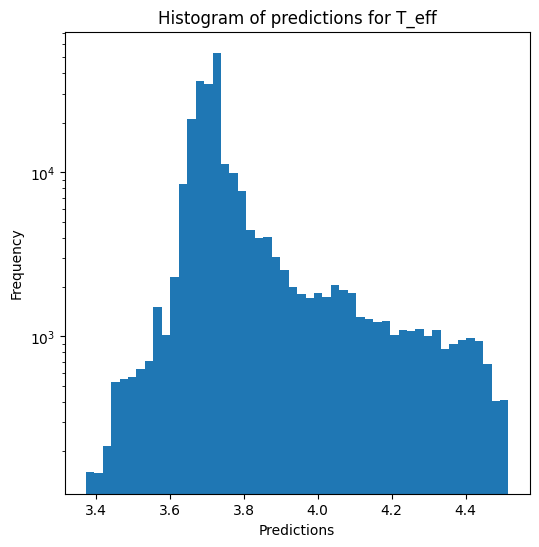

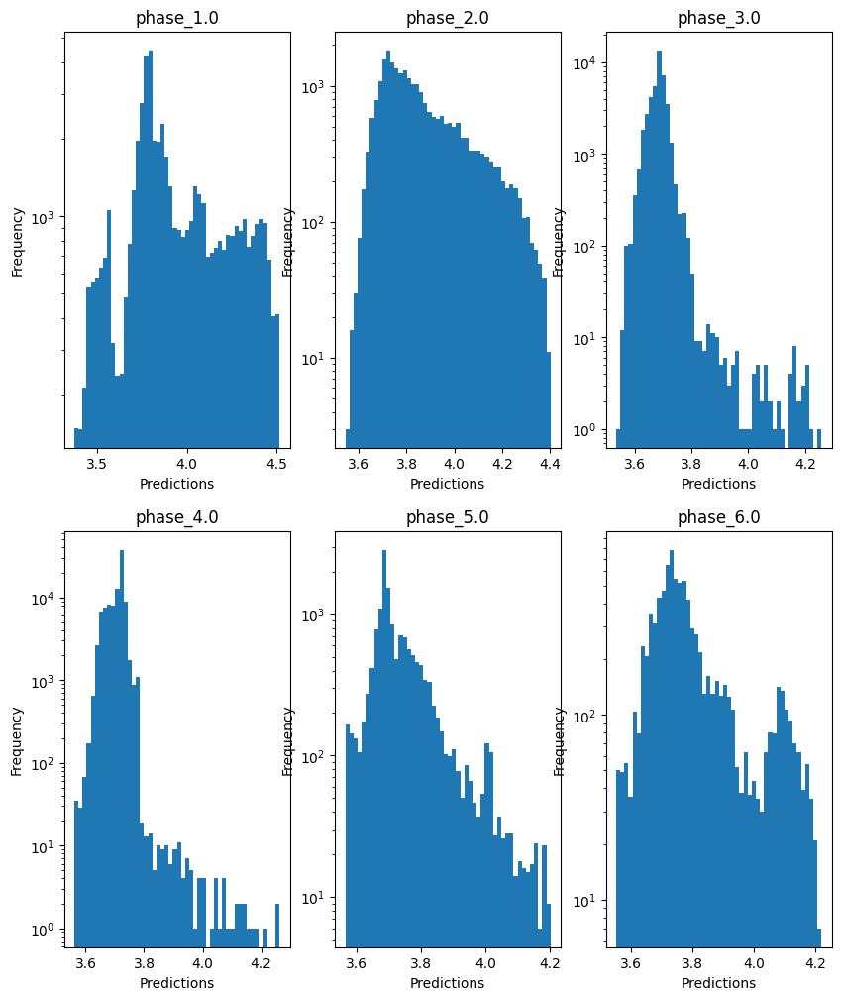


log_g results for the phase category with a value of 1.0
  value range :  3.233 - 5.345
  RVE :  0.1089278378839631
  RMSE :  0.3351776664267712
  MAE :  0.10336078345904559
  MedAE :  0.007399999999998741
  CORR :  0.7815395212099527
  MAX_ER :  3.8674
  Percentiles : 
    75th percentile :  0.031200000000001005
    90th percentile :  0.37260000000000026
    95th percentile :  0.44357500000000005
    99th percentile :  1.8457350000000003

log_g results for the phase category with a value of 2.0
  value range :  0.638 - 4.299
  RVE :  0.6590355079132489
  RMSE :  0.5627535135366373
  MAE :  0.3371827262864228
  MedAE :  0.15195000000000003
  CORR :  0.8228019605636389
  MAX_ER :  3.1710000000000003
  Percentiles : 
    75th percentile :  0.3658250000000005
    90th percentile :  1.0403
    95th percentile :  1.3434999999999997
    99th percentile :  1.9782920000000013

log_g results for the phase category with a value of 3.0
  value range :  -0.384 - 3.823
  RVE :  -0.0404867965009381

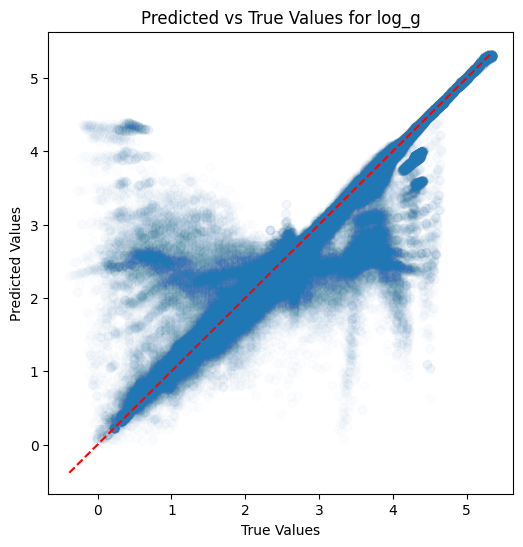

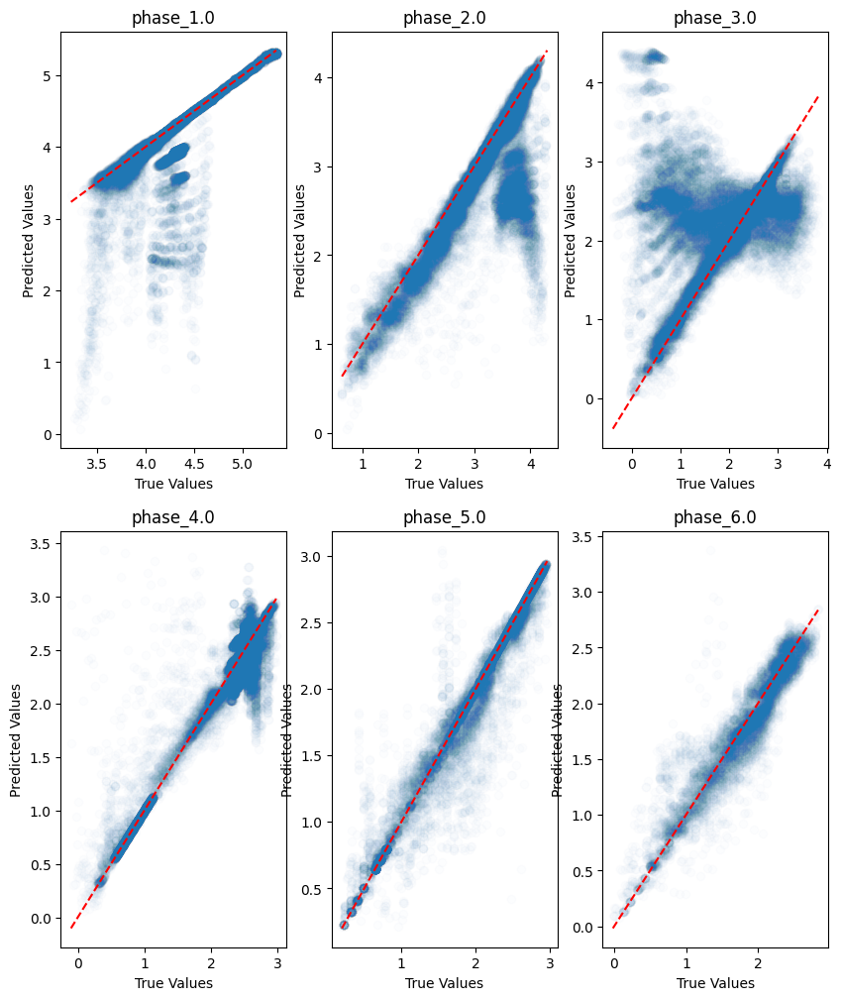

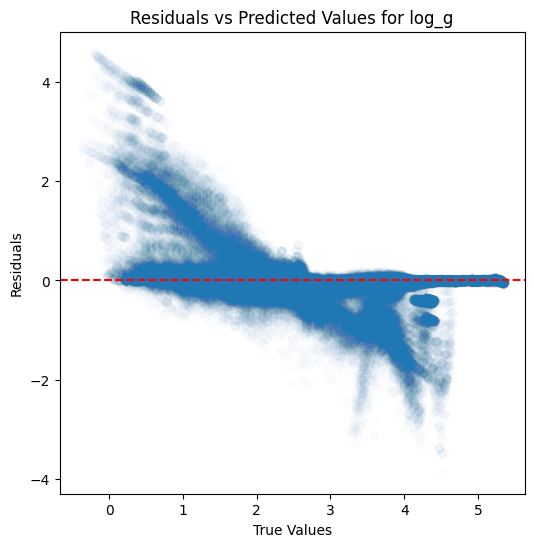

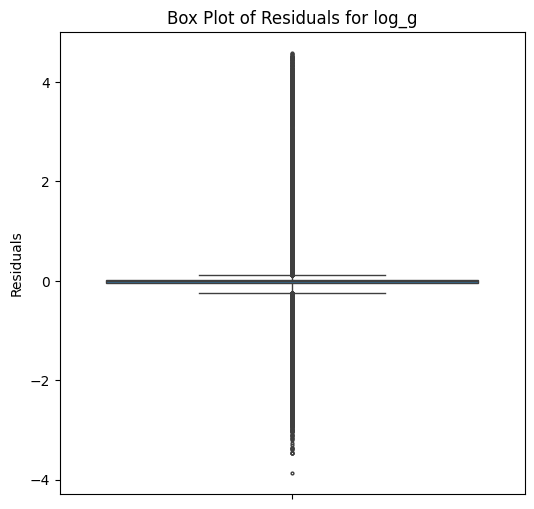

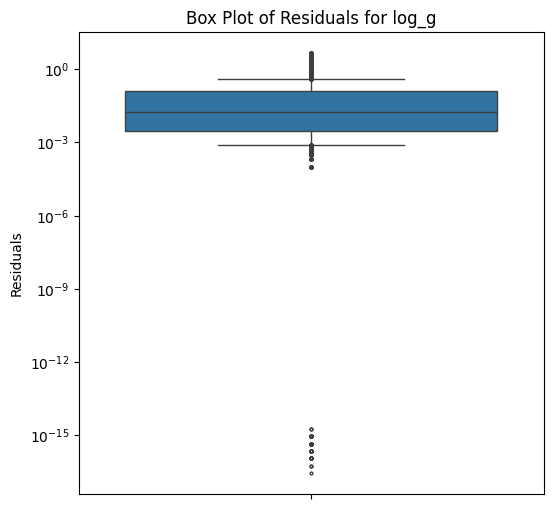

...

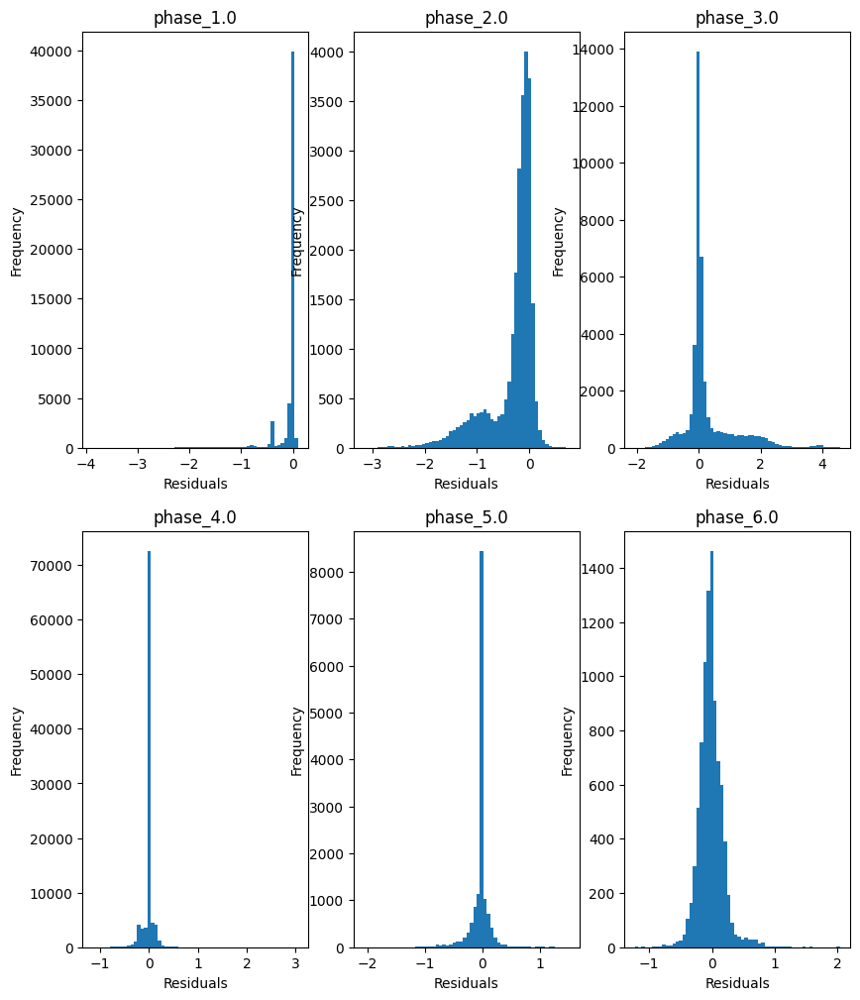

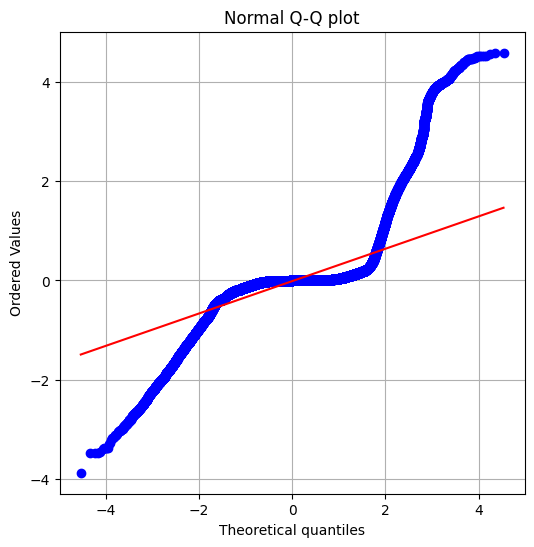

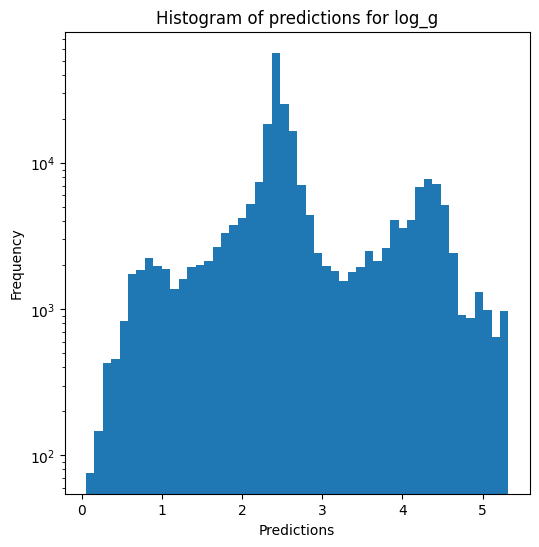

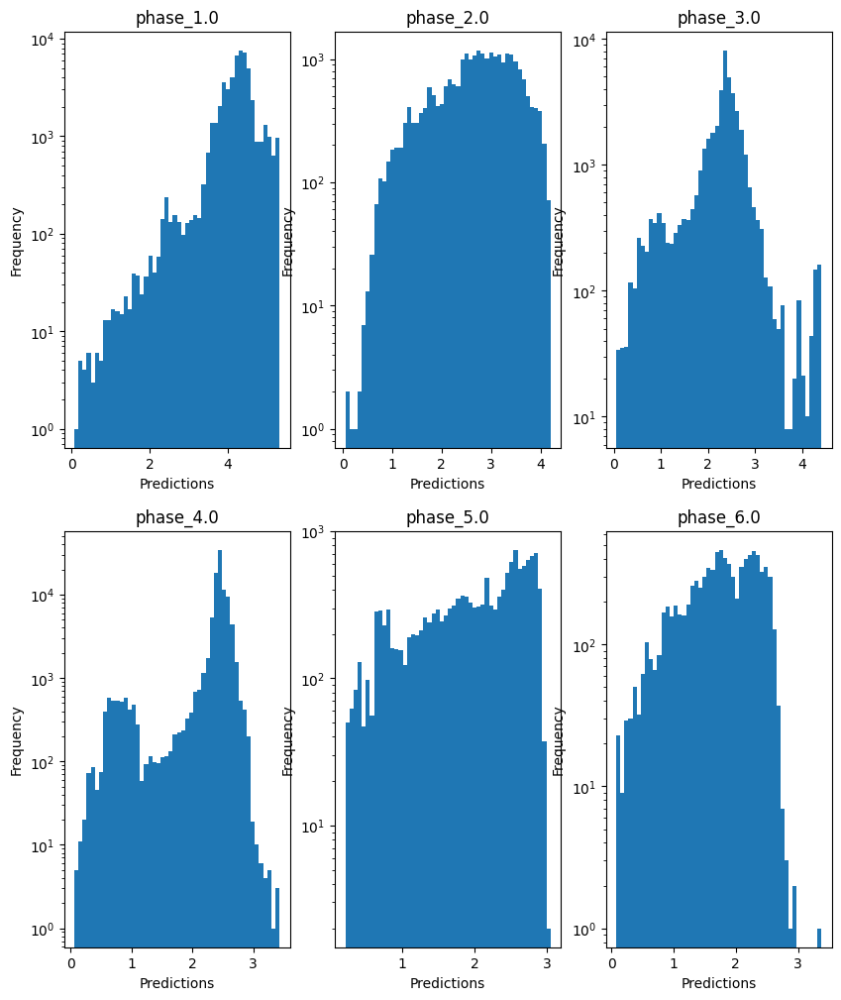

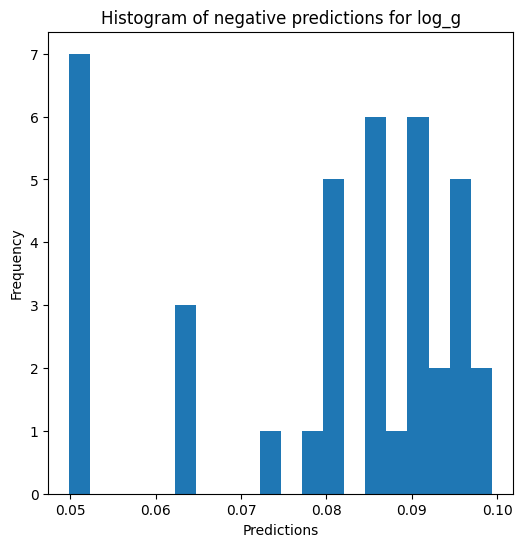


radius results for the phase category with a value of 1.0
  value range :  -0.9763360818022064 - 1.1687920203141815
  RVE :  0.8074730015574957
  RMSE :  0.16815581672234975
  MAE :  0.05363365420345857
  MedAE :  0.0060984068915196366
  CORR :  0.9203539551263981
  MAX_ER :  1.9347018470832194
  Percentiles : 
    75th percentile :  0.020380848641326568
    90th percentile :  0.18633980564472985
    95th percentile :  0.22204669015140904
    99th percentile :  0.9249102419878458

radius results for the phase category with a value of 2.0
  value range :  0.0199466816788423 - 2.458486763798206
  RVE :  0.8140747719674875
  RMSE :  0.2814731782872199
  MAE :  0.1687147635484893
  MedAE :  0.076107351578381
  CORR :  0.9022863484493792
  MAX_ER :  1.5854650397107324
  Percentiles : 
    75th percentile :  0.18299764658253279
    90th percentile :  0.520435670527087
    95th percentile :  0.6711544371067948
    99th percentile :  0.9887956861341651

radius results for the phase category w

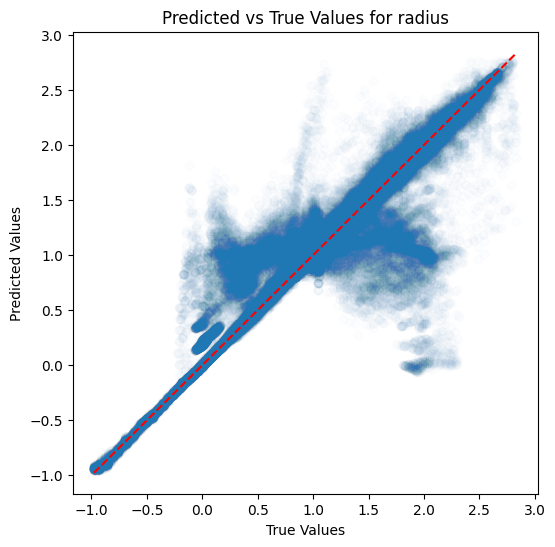

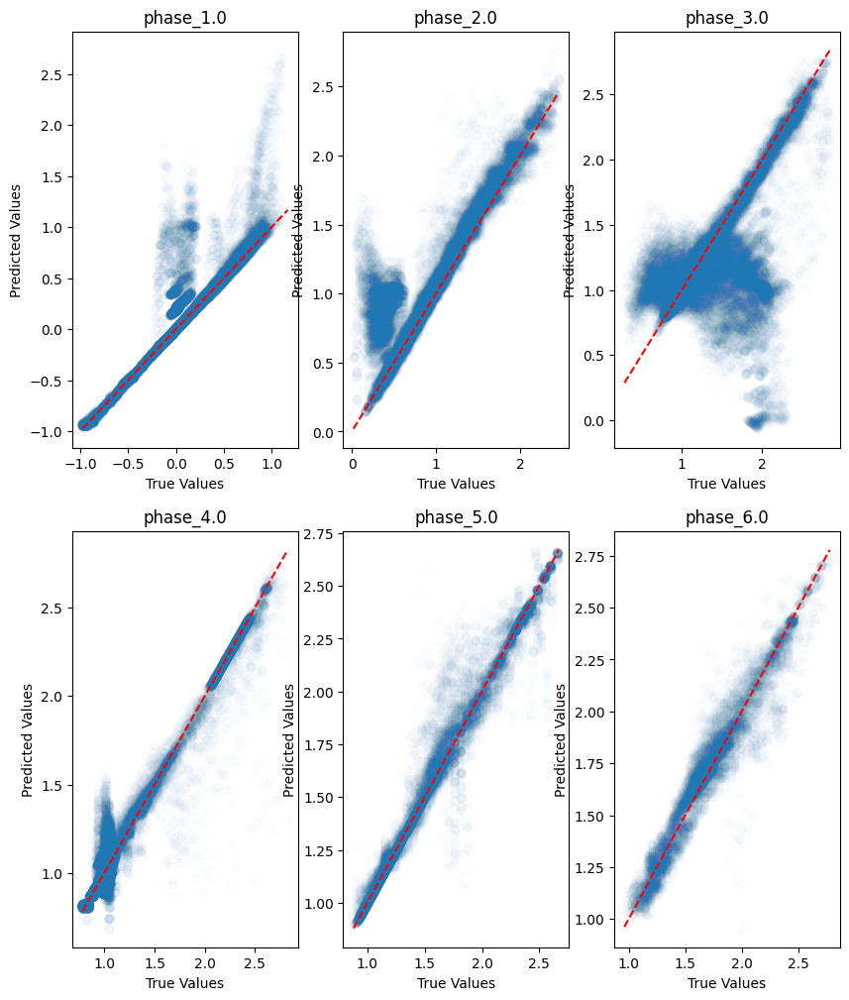

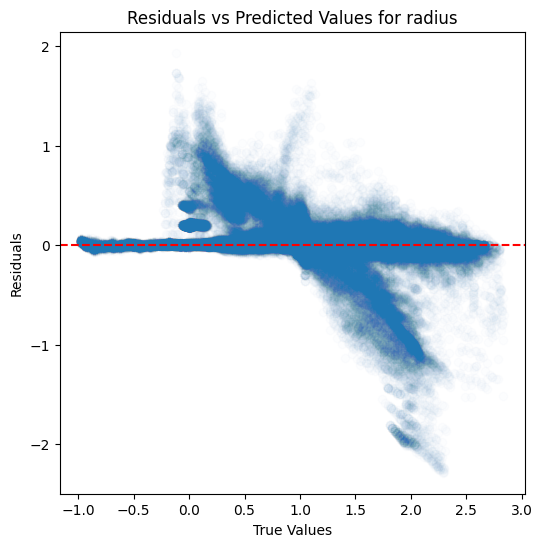

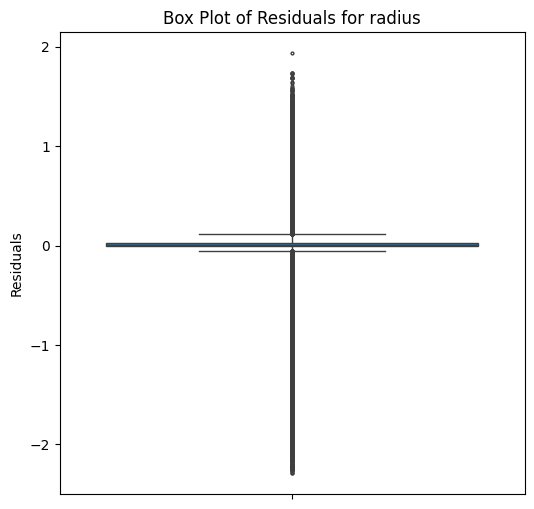

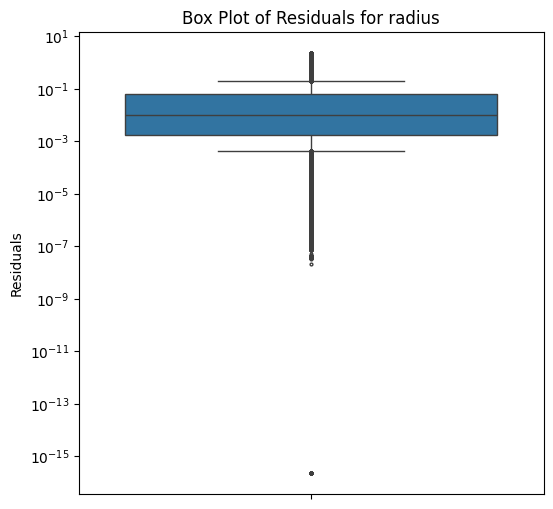

...

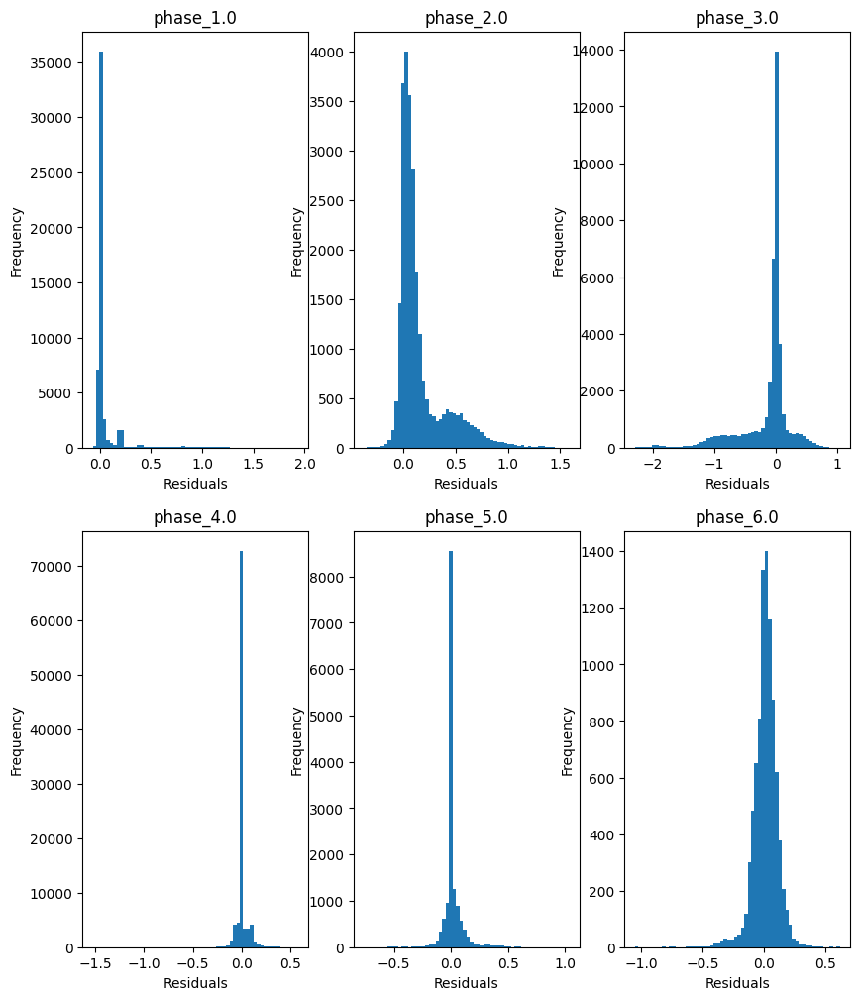

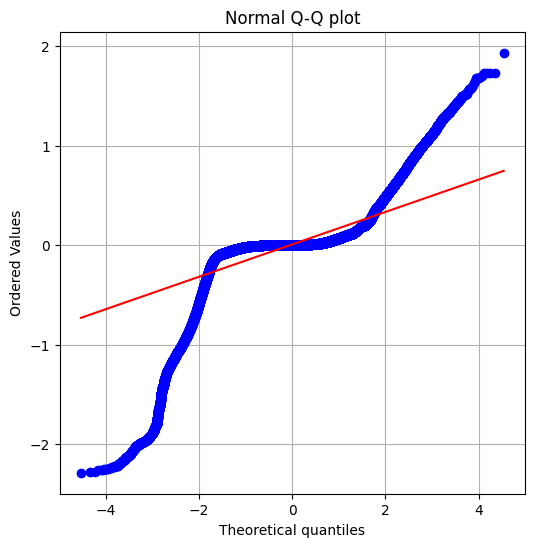

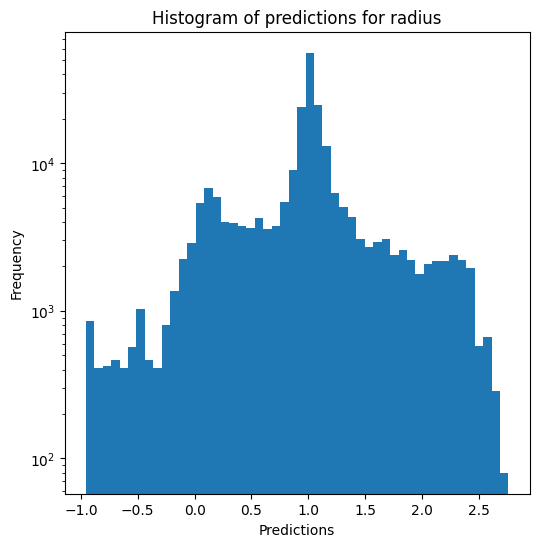

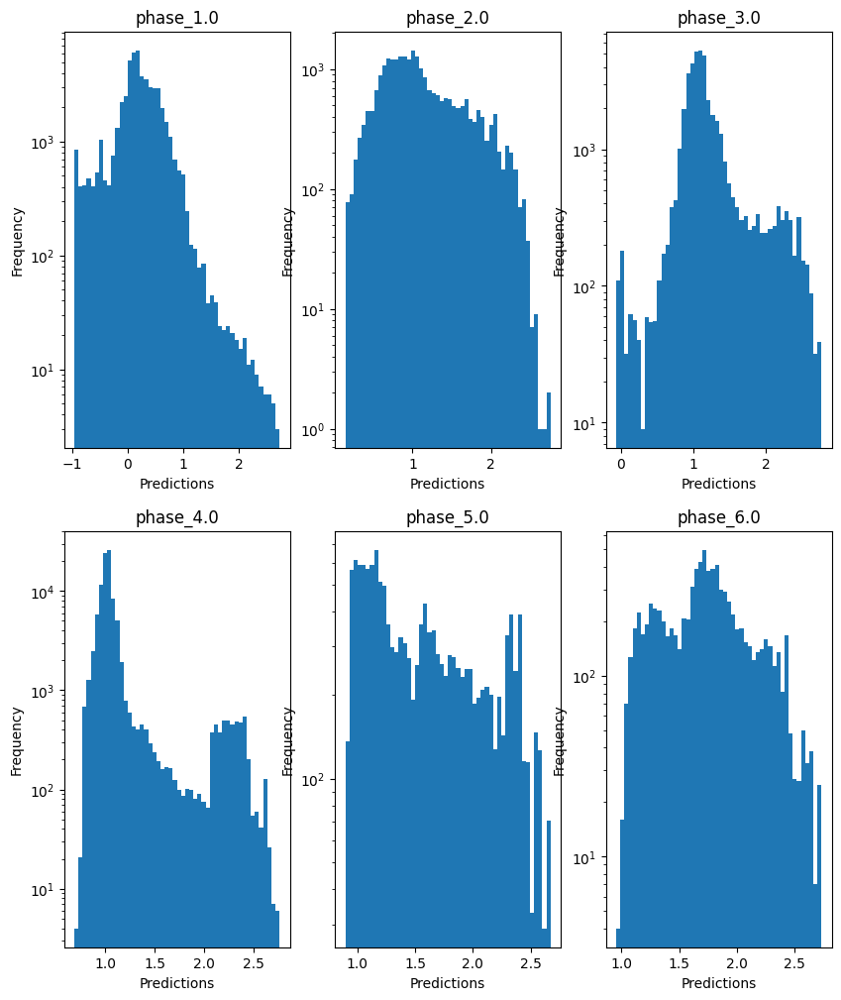

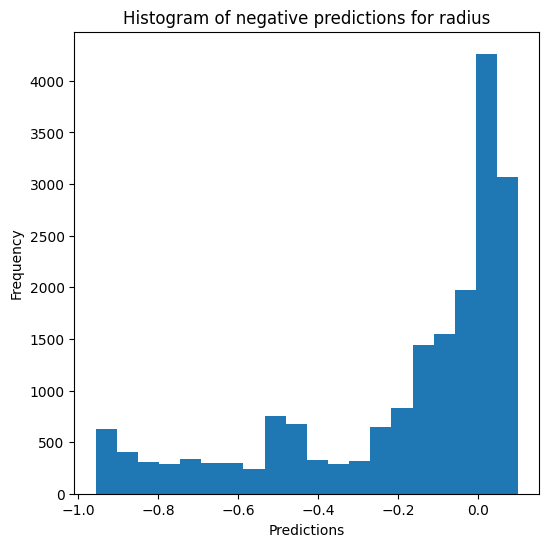

Saving predictions and results...


In [39]:
best_params_KNN = {'n_jobs':10, 'algorithm': 'ball_tree', 'leaf_size': 75, 'n_neighbors': 10, 'weights': 'uniform'}

print(path_to_results)
dt_evaluator = Model_evaluator("KNN", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)
dt_evaluator.evaluate_Kfold_results(KNeighborsRegressor, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, random_state=12, override=override, use_preds=use_preds, save=save, show=show, scaler_name="power", **best_params_KNN)

### Decision tree

In [40]:
tag = "scale_power"

#### Tuning the criterion and splitter parameter

In [ ]:
cv_params = {'criterion' : ["squared_error", "friedman_mse"], # absolute_error prend beaucoup de temps et poisson n'est pas possible avec des valeurs négatives
             'splitter' : ["best", "random"]
            }

gscv_dt_1 = GridSearchCV(DecisionTreeRegressor(),
                         param_grid = cv_params,
                         scoring = scoring,
                         cv = 10,
                         verbose = 2,
                         n_jobs = 10,
                         refit="neg_root_mean_squared_error"
)

gscv_dt_1.fit(X_train_power,y_train)
display_grid_search(gscv_dt_1)

Fitting 10 folds for each of 4 candidates, totalling 40 fits


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_criterion,param_splitter,params,split0_test_neg_root_mean_squared_error,split1_test_neg_root_mean_squared_error,split2_test_neg_root_mean_squared_error,split3_test_neg_root_mean_squared_error,split4_test_neg_root_mean_squared_error,split5_test_neg_root_mean_squared_error,split6_test_neg_root_mean_squared_error,split7_test_neg_root_mean_squared_error,split8_test_neg_root_mean_squared_error,split9_test_neg_root_mean_squared_error,mean_test_neg_root_mean_squared_error,std_test_neg_root_mean_squared_error,rank_test_neg_root_mean_squared_error,split0_test_neg_mean_absolute_error,split1_test_neg_mean_absolute_error,split2_test_neg_mean_absolute_error,split3_test_neg_mean_absolute_error,split4_test_neg_mean_absolute_error,split5_test_neg_mean_absolute_error,split6_test_neg_mean_absolute_error,split7_test_neg_mean_absolute_error,split8_test_neg_mean_absolute_error,split9_test_neg_mean_absolute_error,mean_test_neg_mean_absolute_error,std_test_neg_mean_absolute_error,rank_test_neg_mean_absolute_error
0,0.963652,0.019351,0.014625,0.001670,squared_error,best,"{'criterion': 'squared_error', 'splitter': 'be...",-0.274512,-0.264848,-0.275116,-0.272721,-0.275583,-0.270468,-0.269075,-0.270708,-0.275619,-0.274217,-0.272287,0.003321,2,-0.079056,-0.076504,-0.078628,-0.079672,-0.080277,-0.079649,-0.078586,-0.078600,-0.080034,-0.080625,-0.079163,0.001125,2
1,0.461603,0.011596,0.018979,0.001950,squared_error,random,"{'criterion': 'squared_error', 'splitter': 'ra...",-0.281322,-0.272604,-0.285775,-0.280697,-0.284673,-0.281351,-0.276688,-0.280018,-0.280540,-0.280719,-0.280439,0.003518,4,-0.081541,-0.078707,-0.082113,-0.082632,-0.082955,-0.083564,-0.080936,-0.081770,-0.081632,-0.082863,-0.081871,0.001293,4
2,1.014862,0.072229,0.017433,0.001600,friedman_mse,best,"{'criterion': 'friedman_mse', 'splitter': 'best'}",-0.271531,-0.262471,-0.275832,-0.274303,-0.274223,-0.270011,-0.267618,-0.271327,-0.270511,-0.273388,-0.271122,0.003688,1,-0.078289,-0.075603,-0.078859,-0.079924,-0.079935,-0.079565,-0.078045,-0.078764,-0.078859,-0.080589,-0.078843,0.001318,1
3,0.408064,0.022673,0.015012,0.003623,friedman_mse,random,"{'criterion': 'friedman_mse', 'splitter': 'ran...",-0.275669,-0.275433,-0.284684,-0.275324,-0.282931,-0.276924,-0.276029,-0.282068,-0.284176,-0.282310,-0.279555,0.003772,3,-0.079803,-0.079818,-0.081786,-0.080632,-0.082568,-0.082123,-0.080749,-0.082441,-0.083303,-0.083257,-0.081648,0.001251,3


Best parameters {'criterion': 'friedman_mse', 'splitter': 'best'}
Best score -0.27112151688046915


#### Tuning the max_depth, min_samples_split and min_samples_leaf parameter

In [33]:
cv_params = {'max_depth' : [25, 50, 75, 100, None],
             'min_samples_split' : [2, 4, 6, 8, 10],
             'min_samples_leaf' : [1, 2, 3, 4, 5],
            }

gscv_dt_2 = GridSearchCV(DecisionTreeRegressor(criterion="friedman_mse",
                                               splitter="best"
                                               ),
                         param_grid = cv_params,
                         scoring = scoring,
                         cv = 10,
                         verbose = 2,
                         n_jobs = 10,
                         refit="neg_root_mean_squared_error"
)

gscv_dt_2.fit(X_train_power,y_train)
display_grid_search(gscv_dt_2)

Fitting 10 folds for each of 125 candidates, totalling 1250 fits


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,param_min_samples_leaf,param_min_samples_split,params,split0_test_neg_root_mean_squared_error,split1_test_neg_root_mean_squared_error,split2_test_neg_root_mean_squared_error,split3_test_neg_root_mean_squared_error,split4_test_neg_root_mean_squared_error,split5_test_neg_root_mean_squared_error,split6_test_neg_root_mean_squared_error,split7_test_neg_root_mean_squared_error,split8_test_neg_root_mean_squared_error,split9_test_neg_root_mean_squared_error,mean_test_neg_root_mean_squared_error,std_test_neg_root_mean_squared_error,rank_test_neg_root_mean_squared_error,split0_test_neg_mean_absolute_error,split1_test_neg_mean_absolute_error,split2_test_neg_mean_absolute_error,split3_test_neg_mean_absolute_error,split4_test_neg_mean_absolute_error,split5_test_neg_mean_absolute_error,split6_test_neg_mean_absolute_error,split7_test_neg_mean_absolute_error,split8_test_neg_mean_absolute_error,split9_test_neg_mean_absolute_error,mean_test_neg_mean_absolute_error,std_test_neg_mean_absolute_error,rank_test_neg_mean_absolute_error
0,0.772612,0.039737,0.012920,0.001764,25,1,2,"{'max_depth': 25, 'min_samples_leaf': 1, 'min_...",-0.273912,-0.263595,-0.282618,-0.273558,-0.276825,-0.272986,-0.274734,-0.277928,-0.272485,-0.277261,-0.274590,0.004660,125,-0.097814,-0.093535,-0.099358,-0.099354,-0.098747,-0.098849,-0.102001,-0.101362,-0.097898,-0.100577,-0.098949,0.002233,125
1,1.071967,0.046237,0.017502,0.002272,25,1,4,"{'max_depth': 25, 'min_samples_leaf': 1, 'min_...",-0.268682,-0.258937,-0.276667,-0.268507,-0.270360,-0.268305,-0.270332,-0.272095,-0.267419,-0.269316,-0.269062,0.004203,120,-0.097154,-0.092894,-0.098525,-0.098689,-0.097706,-0.098288,-0.101359,-0.100513,-0.097408,-0.099311,-0.098185,0.002169,119
2,0.941007,0.018268,0.013829,0.000893,25,1,6,"{'max_depth': 25, 'min_samples_leaf': 1, 'min_...",-0.264247,-0.255418,-0.270382,-0.264104,-0.263636,-0.262825,-0.265239,-0.266282,-0.262456,-0.263972,-0.263856,0.003534,119,-0.097079,-0.092670,-0.097666,-0.098235,-0.096741,-0.097709,-0.100853,-0.099969,-0.097094,-0.098658,-0.097667,0.002080,118
3,0.827715,0.008620,0.012402,0.000996,25,1,8,"{'max_depth': 25, 'min_samples_leaf': 1, 'min_...",-0.260403,-0.251135,-0.265205,-0.261084,-0.261293,-0.258586,-0.260955,-0.263697,-0.257894,-0.260306,-0.260056,0.003602,114,-0.096971,-0.092397,-0.097134,-0.098197,-0.096939,-0.097369,-0.100620,-0.100051,-0.096671,-0.098373,-0.097472,0.002120,116
4,0.833275,0.012585,0.012094,0.001280,25,1,10,"{'max_depth': 25, 'min_samples_leaf': 1, 'min_...",-0.256731,-0.249526,-0.262251,-0.258878,-0.255645,-0.254447,-0.258695,-0.258650,-0.253242,-0.256497,-0.256456,0.003353,110,-0.096958,-0.092611,-0.097191,-0.098300,-0.096324,-0.097100,-0.100775,-0.099709,-0.096240,-0.098356,-0.097356,0.002102,111
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
120,0.910338,0.019975,0.013800,0.001365,None,5,2,"{'max_depth': None, 'min_samples_leaf': 5, 'mi...",-0.227675,-0.222334,-0.231493,-0.230559,-0.231958,-0.223753,-0.227690,-0.228991,-0.227464,-0.226482,-0.227840,0.002968,9,-0.076820,-0.074704,-0.077420,-0.078332,-0.078367,-0.077475,-0.077734,-0.077993,-0.077692,-0.079063,-0.077560,0.001117,85
121,0.890621,0.011304,0.013356,0.001080,None,5,4,"{'max_depth': None, 'min_samples_leaf': 5, 'mi...",-0.227668,-0.222027,-0.231600,-0.230774,-0.231966,-0.223666,-0.227709,-0.228987,-0.227477,-0.226540,-0.227841,0.003069,10,-0.076813,-0.074662,-0.077477,-0.078372,-0.078365,-0.077423,-0.077738,-0.077981,-0.077701,-0.079073,-0.077560,0.001132,87
122,0.860343,0.014974,0.012508,0.000940,None,5,6,"{'max_depth': None, 'min_samples_leaf': 5, 'mi...",-0.227673,-0.222305,-0.231432,-0.230906,-0.231828,-0.223534,-0.227725,-0.228888,-0.227383,-0.226602,-0.227827,0.003004,6,-0.076818,-0.074691,-0.077410,-0.078435,-0.078337,-0.077378,-0.077743,-0.077945,-0.077665,-0.079105,-0.077553,0.001131,79
123,0.89

Best parameters {'max_depth': 75, 'min_samples_leaf': 5, 'min_samples_split': 4}
Best score -0.22778679882292824


#### Tuning the max_features and max_leaf_nodes parameter

In [35]:
scoring = ["neg_root_mean_squared_error", "neg_mean_absolute_error"] # RMSE and MAE

cv_params = {'max_features' : ["sqrt", "log2", None],
             'max_leaf_nodes' : [50, 100, 150, 200, None]
            }

gscv_dt_3 = GridSearchCV(DecisionTreeRegressor(criterion="friedman_mse",
                                               splitter="best",
                                               max_depth=75,
                                               min_samples_leaf=5,
                                               min_samples_split=4
                                               ),
                         param_grid = cv_params,
                         scoring = scoring,
                         cv = 10,
                         verbose = 2,
                         n_jobs = 10,
                         refit="neg_root_mean_squared_error"
)

gscv_dt_3.fit(X_train_power,y_train)
display_grid_search(gscv_dt_3)

Fitting 10 folds for each of 15 candidates, totalling 150 fits


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_features,param_max_leaf_nodes,params,split0_test_neg_root_mean_squared_error,split1_test_neg_root_mean_squared_error,split2_test_neg_root_mean_squared_error,split3_test_neg_root_mean_squared_error,split4_test_neg_root_mean_squared_error,split5_test_neg_root_mean_squared_error,split6_test_neg_root_mean_squared_error,split7_test_neg_root_mean_squared_error,split8_test_neg_root_mean_squared_error,split9_test_neg_root_mean_squared_error,mean_test_neg_root_mean_squared_error,std_test_neg_root_mean_squared_error,rank_test_neg_root_mean_squared_error,split0_test_neg_mean_absolute_error,split1_test_neg_mean_absolute_error,split2_test_neg_mean_absolute_error,split3_test_neg_mean_absolute_error,split4_test_neg_mean_absolute_error,split5_test_neg_mean_absolute_error,split6_test_neg_mean_absolute_error,split7_test_neg_mean_absolute_error,split8_test_neg_mean_absolute_error,split9_test_neg_mean_absolute_error,mean_test_neg_mean_absolute_error,std_test_neg_mean_absolute_error,rank_test_neg_mean_absolute_error
0,0.210613,0.059461,0.005169,0.001479,sqrt,50,"{'max_features': 'sqrt', 'max_leaf_nodes': 50}",-0.472078,-0.435211,-0.500982,-0.516243,-0.515497,-0.487498,-0.488279,-0.571668,-0.510135,-0.575581,-0.507317,0.040239,15,-0.337658,-0.295728,-0.366145,-0.373529,-0.393910,-0.359295,-0.358808,-0.411179,-0.378698,-0.450244,-0.372519,0.039431,15
1,0.206663,0.055251,0.004080,0.001683,sqrt,100,"{'max_features': 'sqrt', 'max_leaf_nodes': 100}",-0.546395,-0.444688,-0.456134,-0.502841,-0.503632,-0.574880,-0.444986,-0.464791,-0.434114,-0.507487,-0.487995,0.044706,14,-0.414779,-0.293070,-0.339612,-0.383997,-0.362068,-0.408461,-0.301084,-0.331278,-0.298173,-0.389384,-0.352191,0.043814,12
2,0.285897,0.074207,0.005887,0.000940,sqrt,150,"{'max_features': 'sqrt', 'max_leaf_nodes': 150}",-0.472182,-0.569206,-0.444826,-0.466141,-0.482371,-0.434785,-0.414167,-0.434207,-0.577849,-0.404380,-0.470011,0.056766,9,-0.328216,-0.409798,-0.315176,-0.335412,-0.338613,-0.316410,-0.281884,-0.284793,-0.417930,-0.267792,-0.329602,0.047789,9
3,0.277576,0.066157,0.006095,0.000585,sqrt,200,"{'max_features': 'sqrt', 'max_leaf_nodes': 200}",-0.480547,-0.493151,-0.502087,-0.469248,-0.456322,-0.443992,-0.516271,-0.557674,-0.484515,-0.449731,-0.485354,0.032608,13,-0.347921,-0.369341,-0.384457,-0.317478,-0.312339,-0.314762,-0.384407,-0.430206,-0.348546,-0.318721,-0.352818,0.037150,13
4,0.540466,0.052671,0.013952,0.002195,sqrt,None,"{'max_features': 'sqrt', 'max_leaf_nodes': None}",-0.245674,-0.246717,-0.247801,-0.246084,-0.247933,-0.242311,-0.253173,-0.247063,-0.251154,-0.239970,-0.246788,0.003613,3,-0.090561,-0.093186,-0.090822,-0.090756,-0.092118,-0.091547,-0.093994,-0.093571,-0.096261,-0.089995,-0.092281,0.001856,3
5,0.281318,0.076023,0.007203,0.003855,log2,50,"{'max_features': 'log2', 'max_leaf_nodes': 50}",-0.462337,-0.483430,-0.515564,-0.472716,-0.453057,-0.553113,-0.477251,-0.467005,-0.441136,-0.516845,-0.484245,0.032523,11,-0.331068,-0.356655,-0.387793,-0.338357,-0.324872,-0.428316,-0.326381,-0.337352,-0.308052,-0.398735,-0.353758,0.036664,14
6,0.233645,0.071496,0.004242,0.002634,log2,100,"{'max_features': 'log2', 'max_leaf_nodes': 100}",-0.448683,-0.572653,-0.491419,-0.503630,-0.499540,-0.472687,-0.515544,-0.489665,-0.417156,-0.437524,-0.484850,0.041910,12,-0.311586,-0.409332,-0.373584,-0.384862,-0.358798,-0.352835,-0.380707,-0.357466,-0.281661,-0.295422,-0.350625,0.039366,11
7,0.294038,0.073068,0.004445,0.001706,log2,150,"{'max_features': 'log2', 'max_leaf_nodes': 150}",-0.403012,-0.427409,-0.486576,-0.437997,-0.482466,-0.474886,-0.384190,-0.435126,-0.483679,-0.535254,-0.455060,0.043096,8,-0.271027,-0.297006,-0.364083,-0.295228,-0.353862,-0.353305,-0.247425,-0.295641,-0.335399,-0.407742,-0.322072,0.046361,8
8,0.266398,0.060104,0.005725,0.001775,log2,200,"{'max_features': 'log2', 'max_leaf_nodes': 200}",-0.420778,-0.476296,-0.484722,-0.522208,-0.512598,-0.574574,-0.485099,-0.410831,-0.418673,-0.441599,-0.

Best parameters {'max_features': None, 'max_leaf_nodes': None}
Best score -0.2278113057161016


ccp_alpha met trop longtemps (20 minutes pour 1 split de K-fold)

#### Training the model with all the fine-tuned parameters and checking the results

../../../../../../results/model_B/fine_tuned_models/

scale_power train data :
Performing K-fold...
Split 1 2 3 4 5 6 7 8 9 10 
Evaluating predictions...
no negative values

T_eff results for the phase category with a value of 1.0
  value range :  3.3621 - 4.5177
  RVE :  0.9772421812931865
  RMSE :  0.040489151334331994
  MAE :  0.00977269136101359
  MedAE :  0.001000000000000334
  CORR :  0.9887261247904539
  MAX_ER :  0.8314529411764711
  Percentiles : 
    75th percentile :  0.005860000000000198
    90th percentile :  0.02056833333333352
    95th percentile :  0.038578749999999995
    99th percentile :  0.12900362745097932

T_eff results for the phase category with a value of 2.0
  value range :  3.6053 - 4.446
  RVE :  0.8999849040982526
  RMSE :  0.05550736977564147
  MAE :  0.03493903905745991
  MedAE :  0.019914999999999683
  CORR :  0.9538568216371859
  MAX_ER :  0.6618833333333334
  Percentiles : 
    75th percentile :  0.04787112299465235
    90th percentile :  0.08693099999

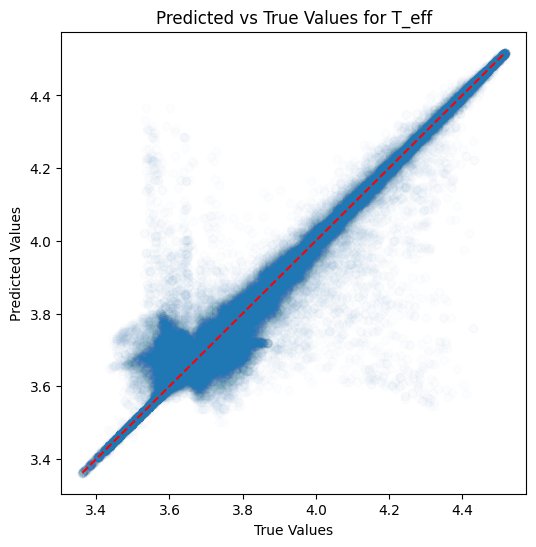

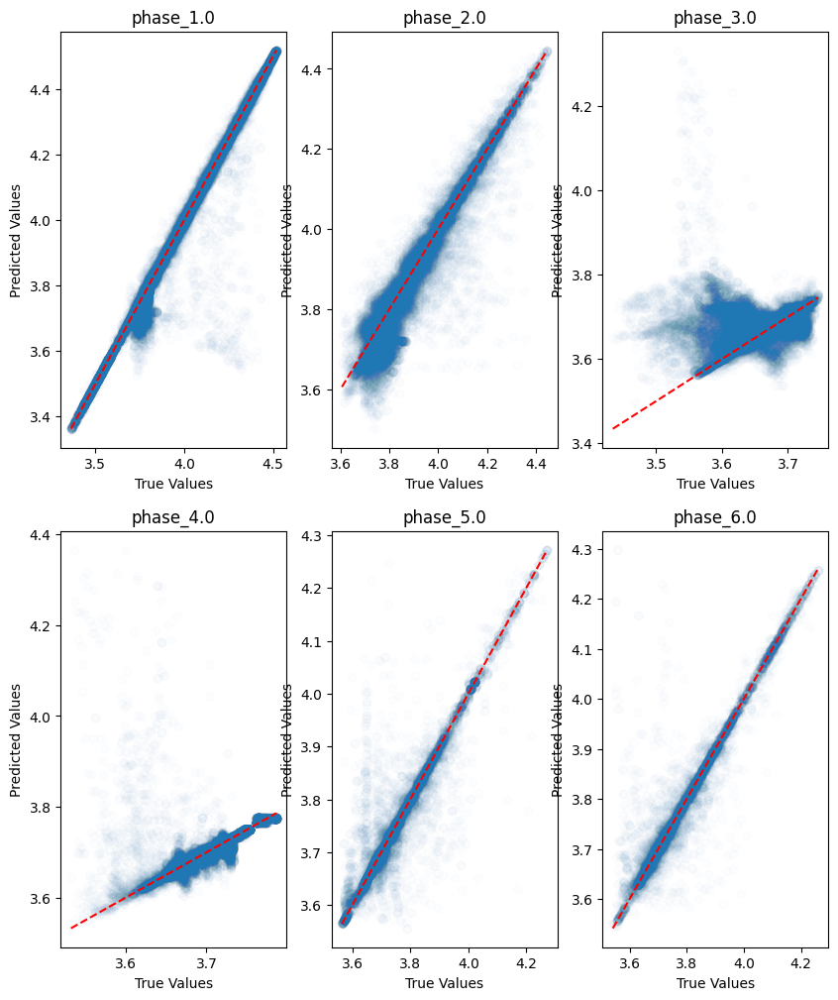

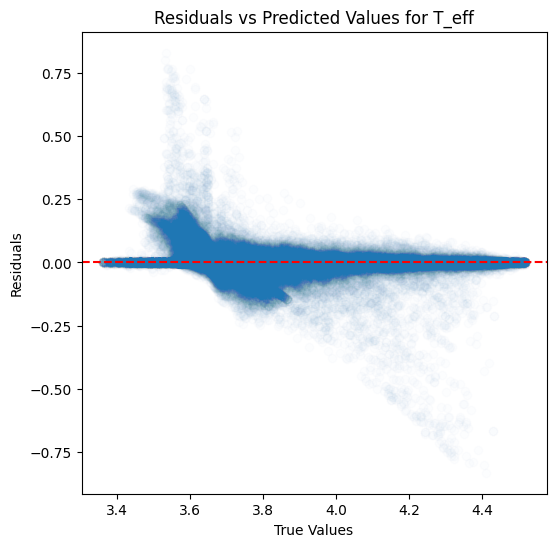

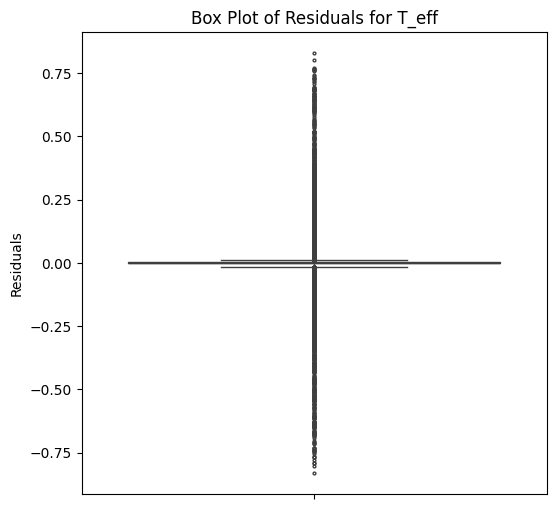

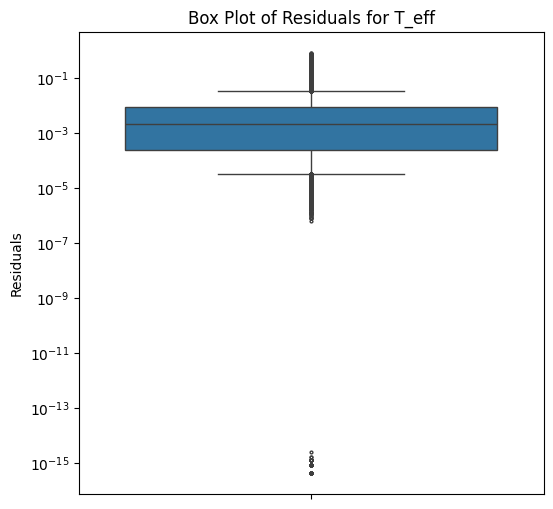

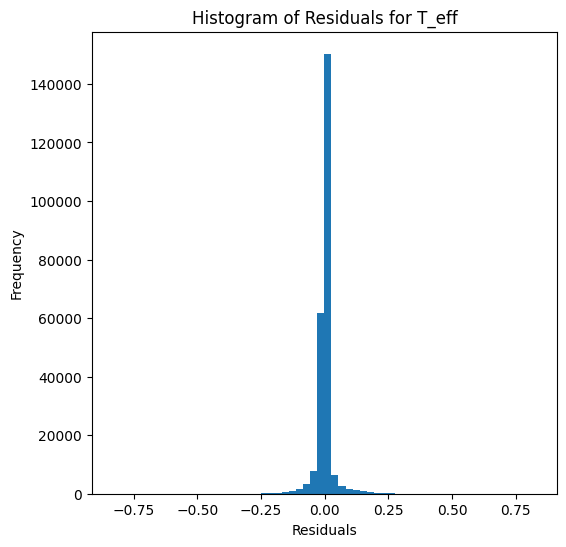

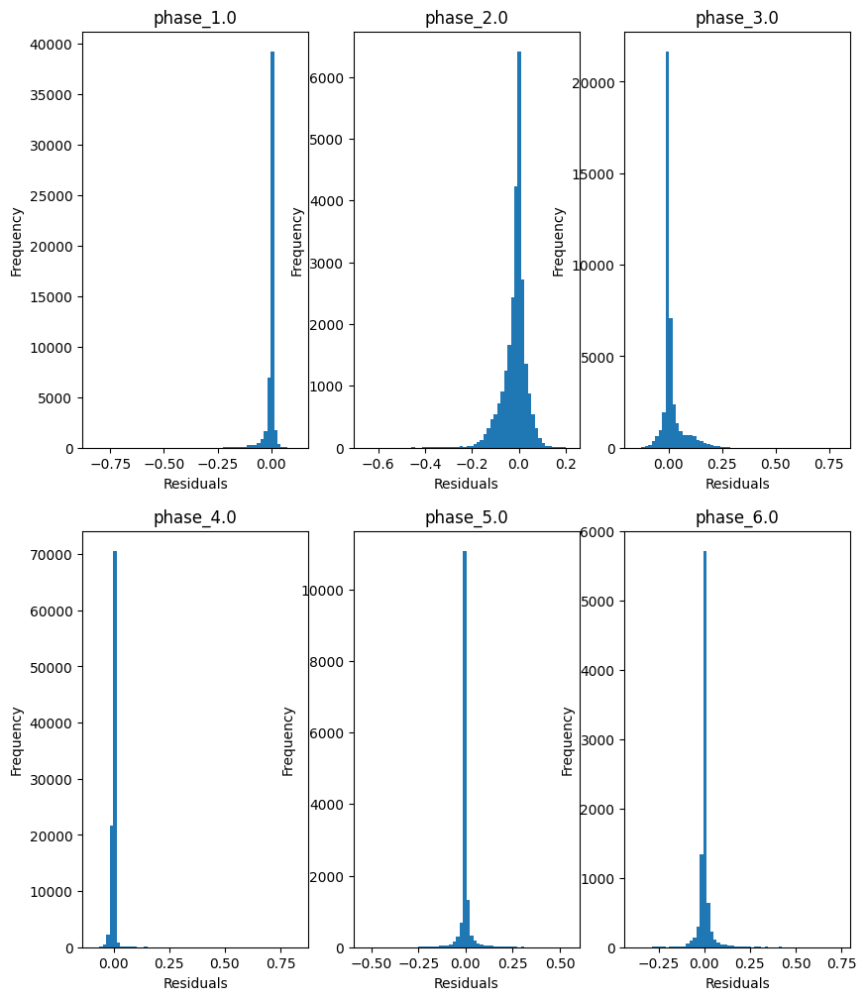

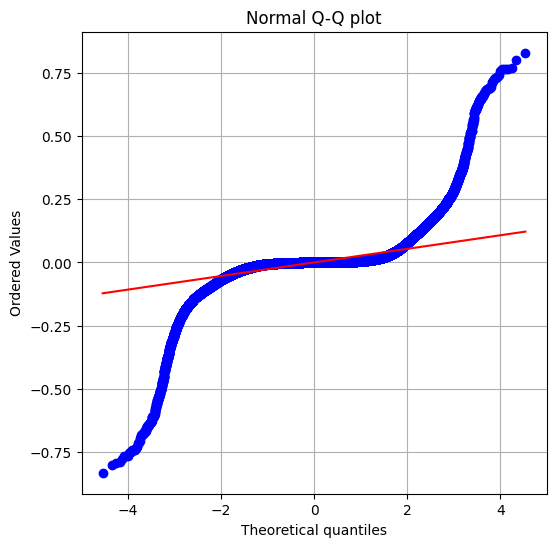

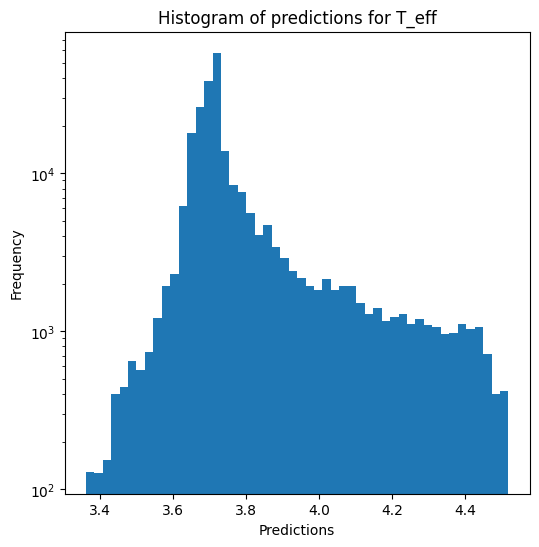

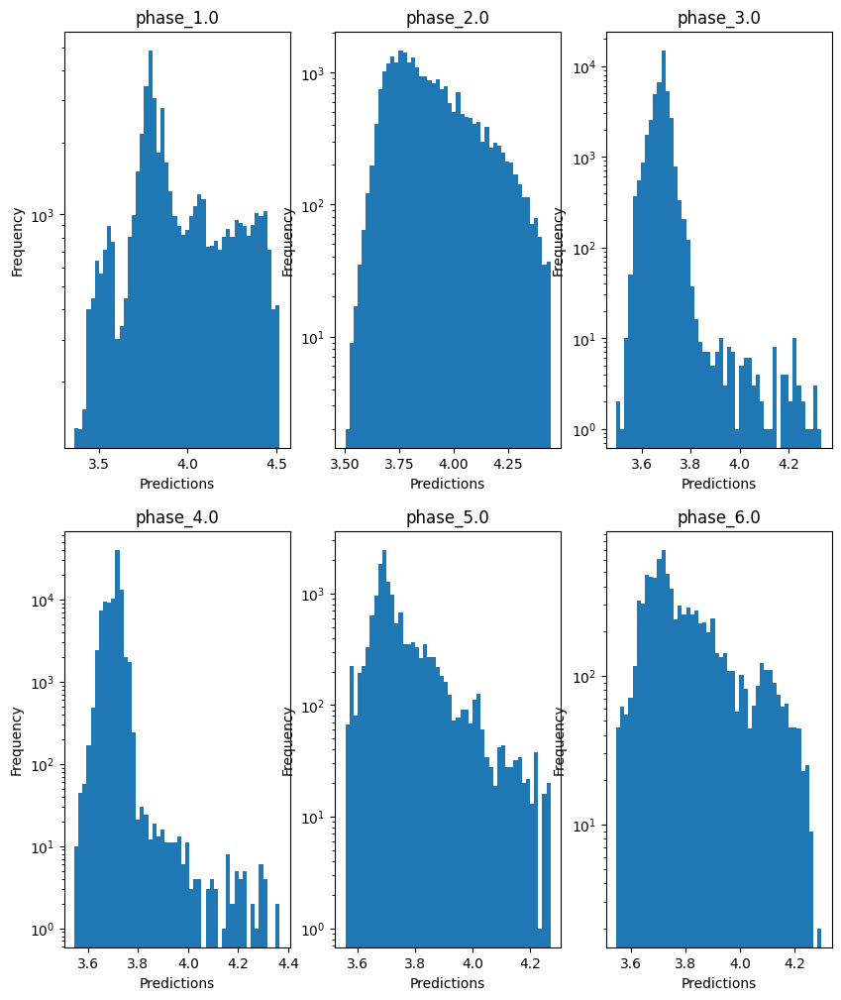


log_g results for the phase category with a value of 1.0
  value range :  3.233 - 5.345
  RVE :  0.14709522187618362
  RMSE :  0.3213101096612843
  MAE :  0.08159763136017523
  MedAE :  0.0044285714285718925
  CORR :  0.7709753195396819
  MAX_ER :  4.464
  Percentiles : 
    75th percentile :  0.01780000000000026
    90th percentile :  0.07399999999999984
    95th percentile :  0.5459642857142853
    99th percentile :  1.803744999999999

log_g results for the phase category with a value of 2.0
  value range :  0.638 - 4.299
  RVE :  0.5717665668180497
  RMSE :  0.5651179590570565
  MAE :  0.28083566918126024
  MedAE :  0.07920000000000016
  CORR :  0.7846494264770759
  MAX_ER :  3.9816000000000003
  Percentiles : 
    75th percentile :  0.23173571428571438
    90th percentile :  1.0064125000000004
    95th percentile :  1.469617914438502
    99th percentile :  2.2064

log_g results for the phase category with a value of 3.0
  value range :  -0.384 - 3.823
  RVE :  -0.01626831850734622

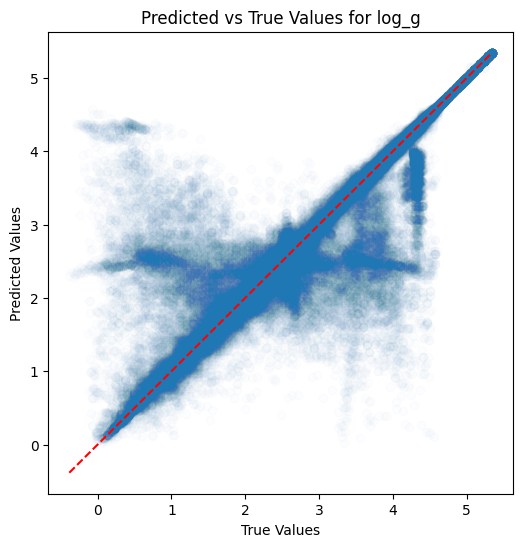

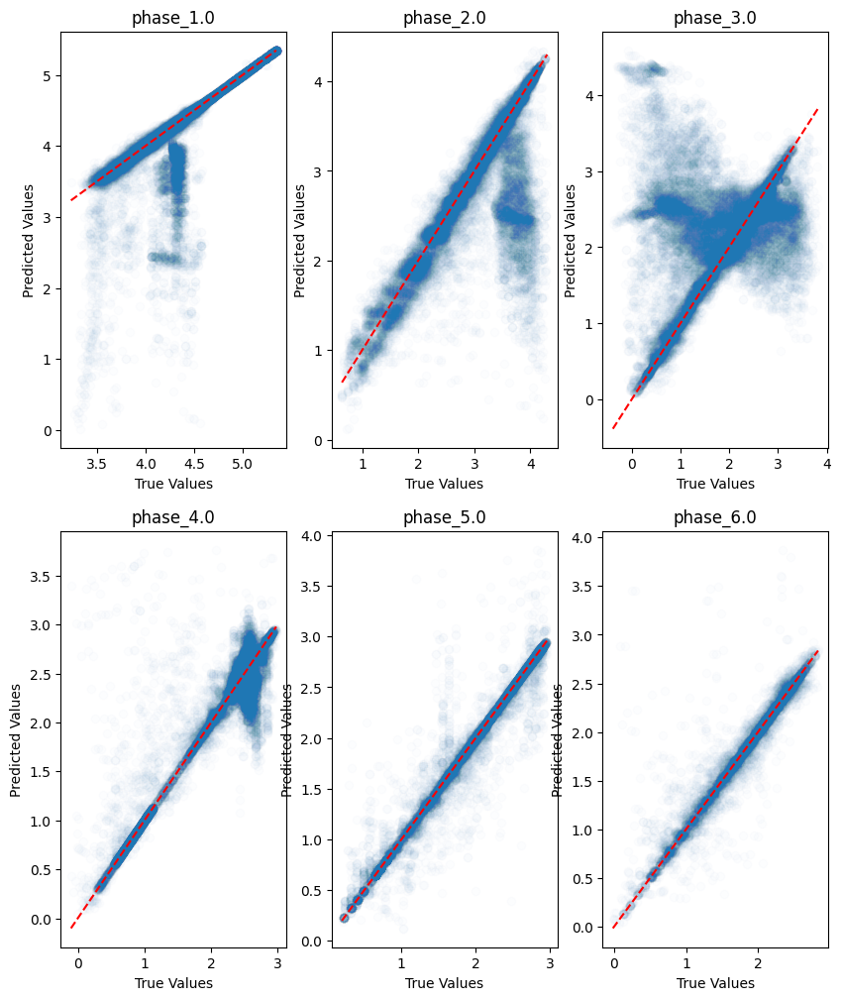

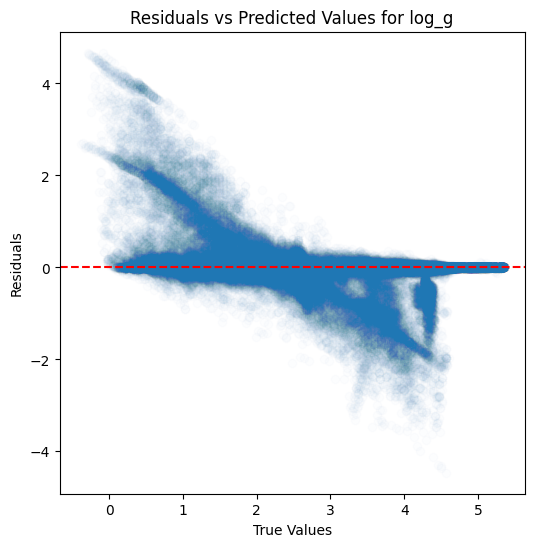

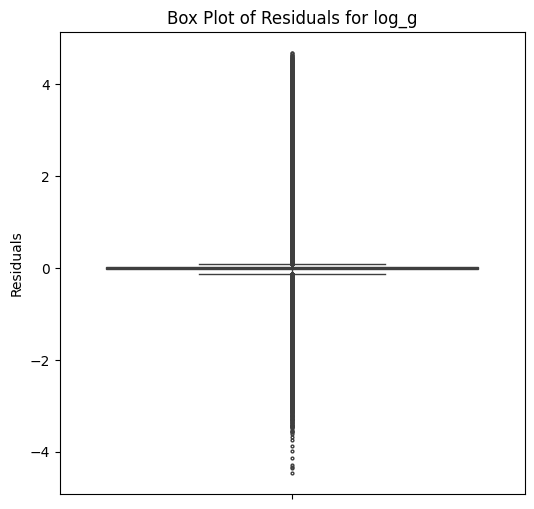

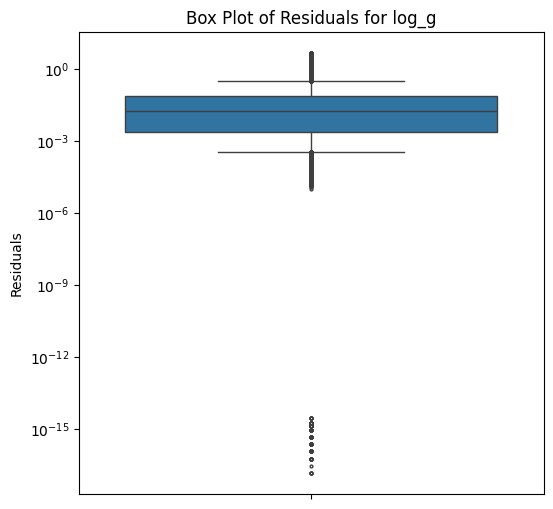

...

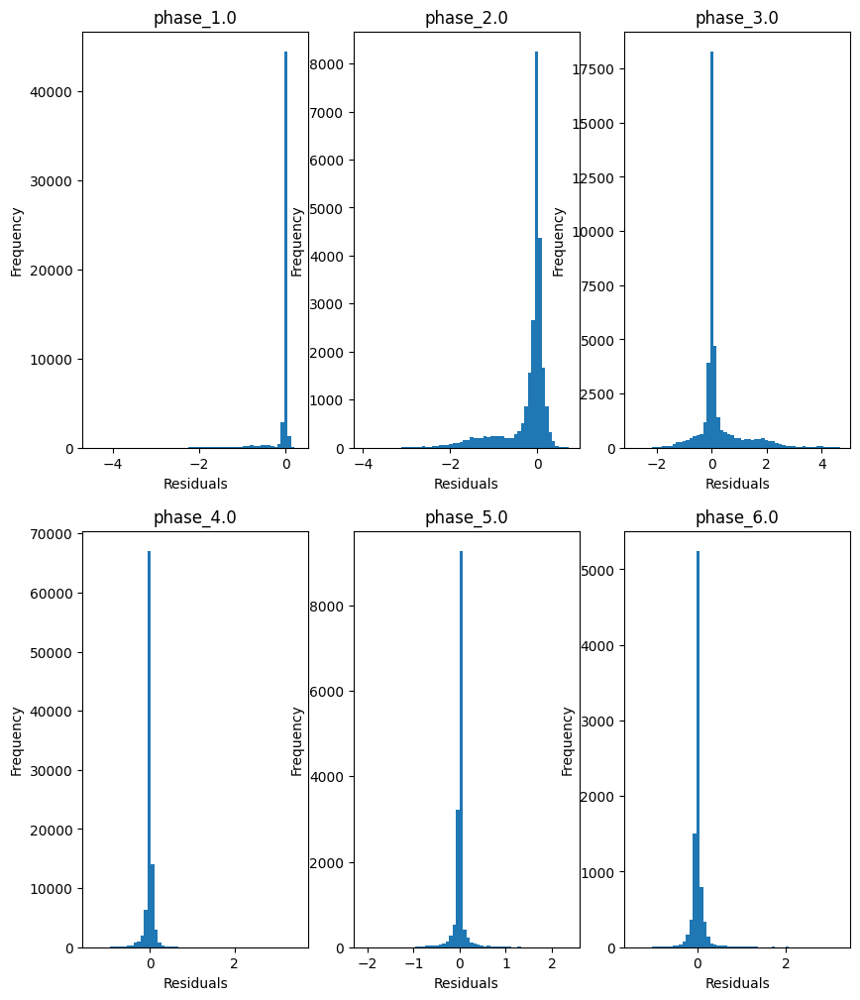

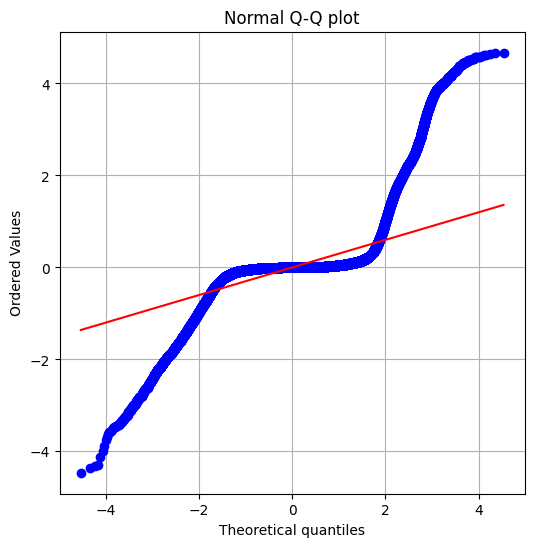

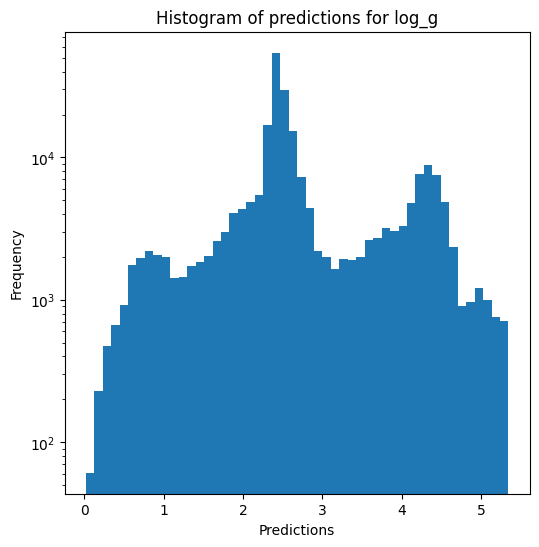

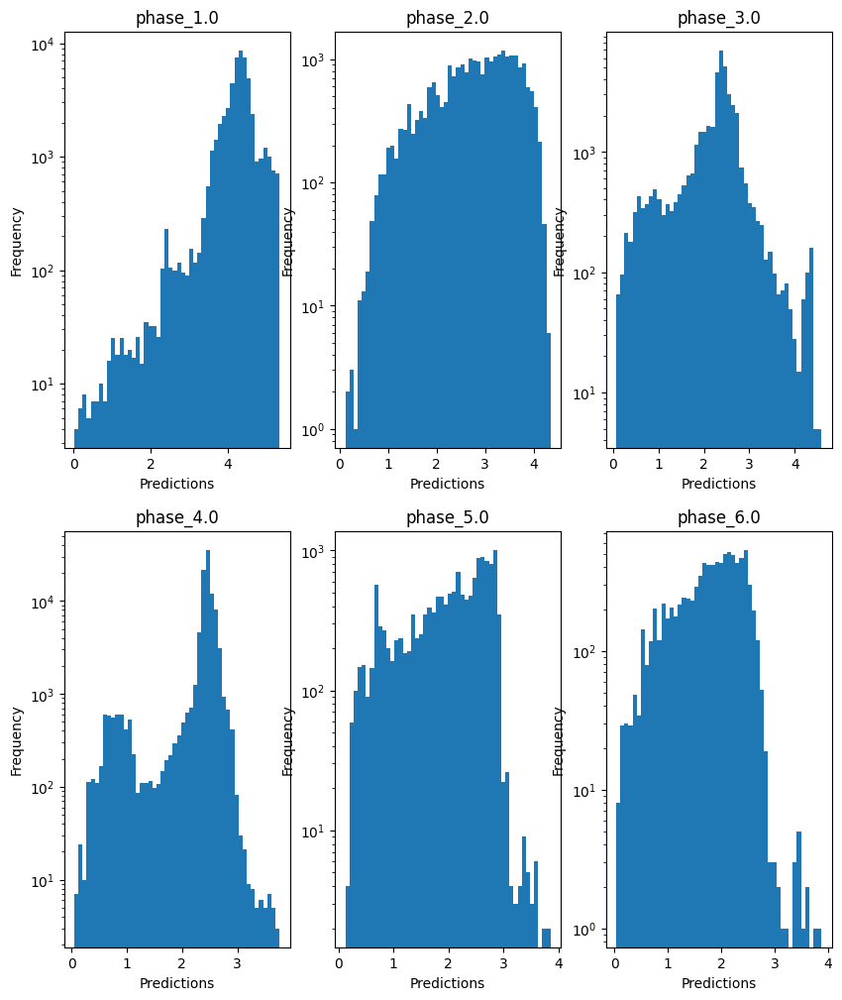

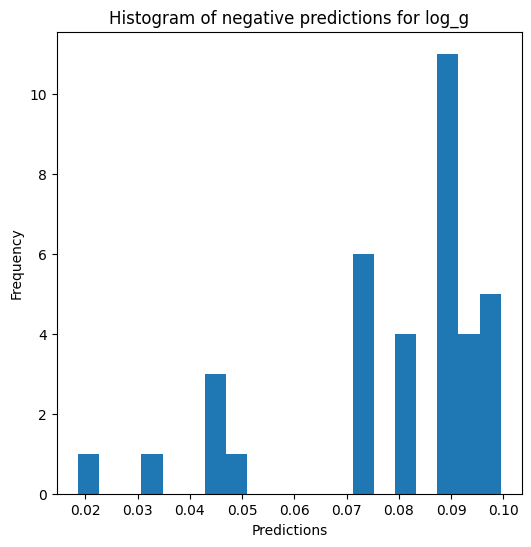


radius results for the phase category with a value of 1.0
  value range :  -0.9763360818022064 - 1.1687920203141815
  RVE :  0.8154550232286575
  RMSE :  0.1611505515769001
  MAE :  0.04234300508878078
  MedAE :  0.0028318054344780713
  CORR :  0.920290526944144
  MAX_ER :  2.2323490860094726
  Percentiles : 
    75th percentile :  0.01147027737276983
    90th percentile :  0.04481436669671637
    95th percentile :  0.2730416845708431
    99th percentile :  0.9022137322786826

radius results for the phase category with a value of 2.0
  value range :  0.0199466816788423 - 2.458486763798206
  RVE :  0.7665666620079234
  RMSE :  0.28258625311758345
  MAE :  0.14049525203365898
  MedAE :  0.03971063682445031
  CORR :  0.8767701068573251
  MAX_ER :  1.9932671788457519
  Percentiles : 
    75th percentile :  0.11591113274539766
    90th percentile :  0.503622948553985
    95th percentile :  0.7347927869455865
    99th percentile :  1.103433800814151

radius results for the phase category wi

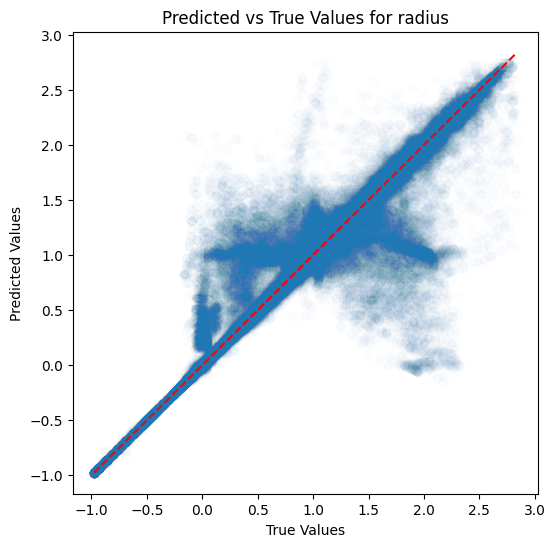

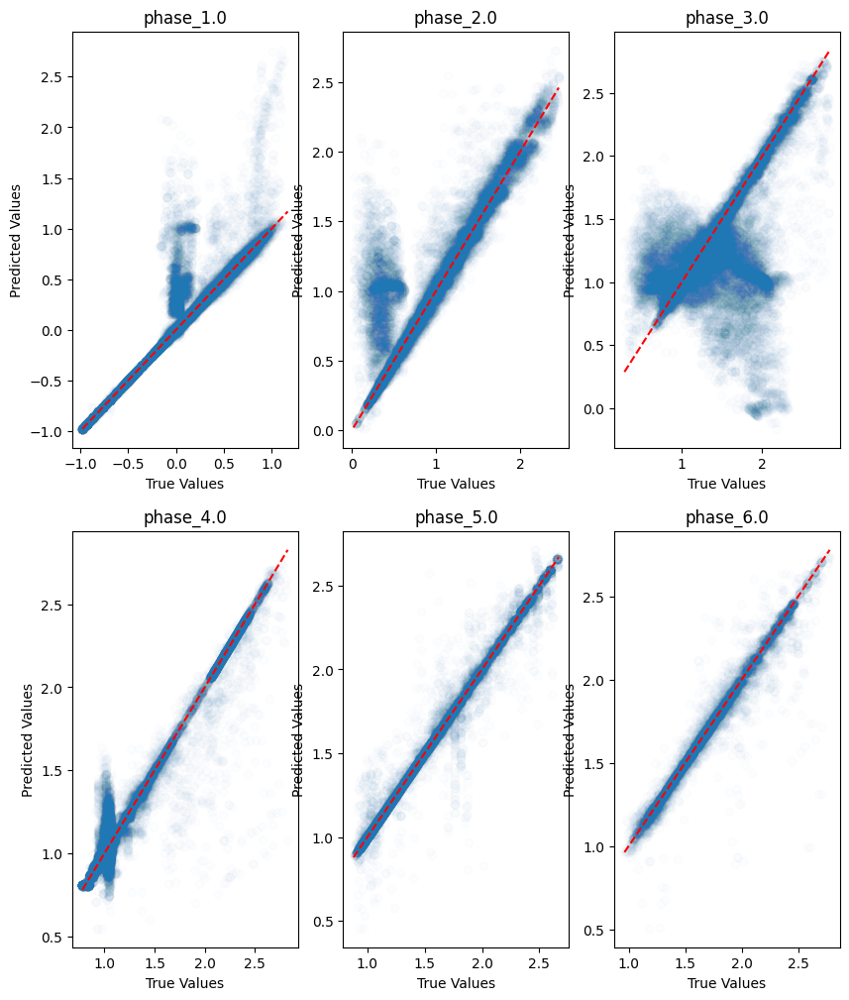

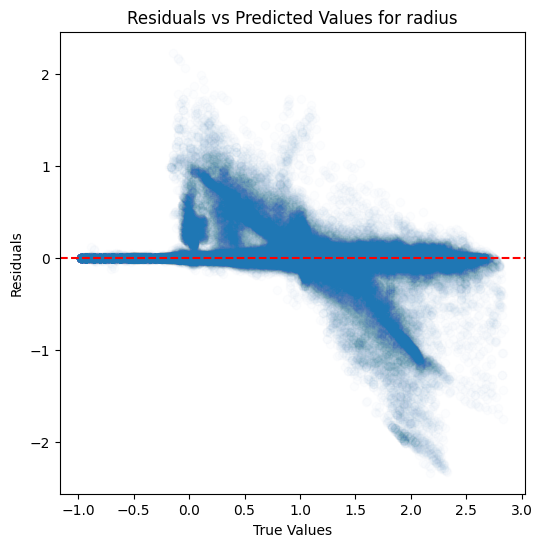

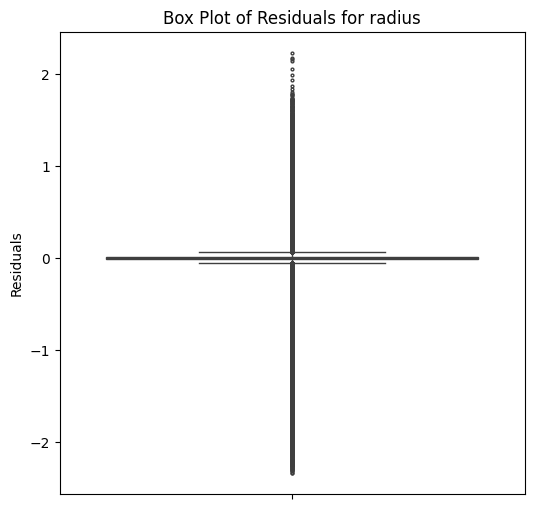

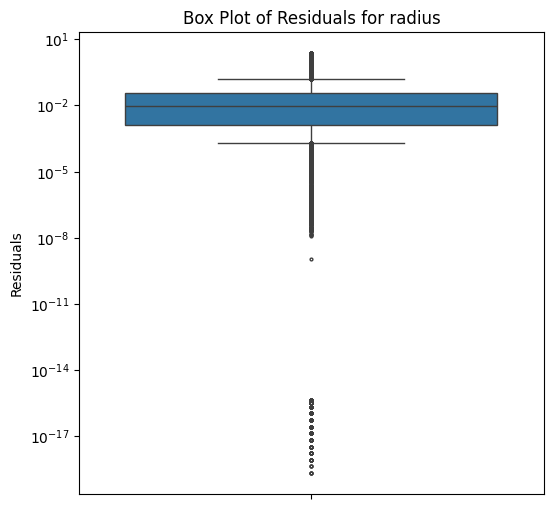

...

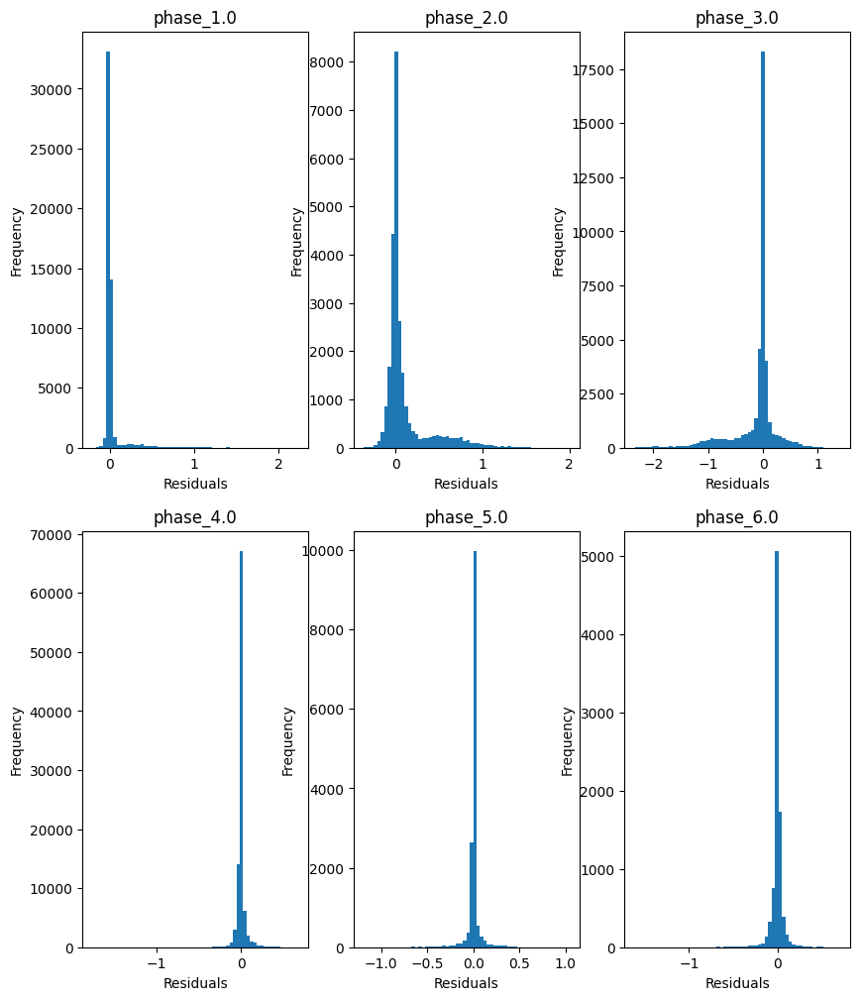

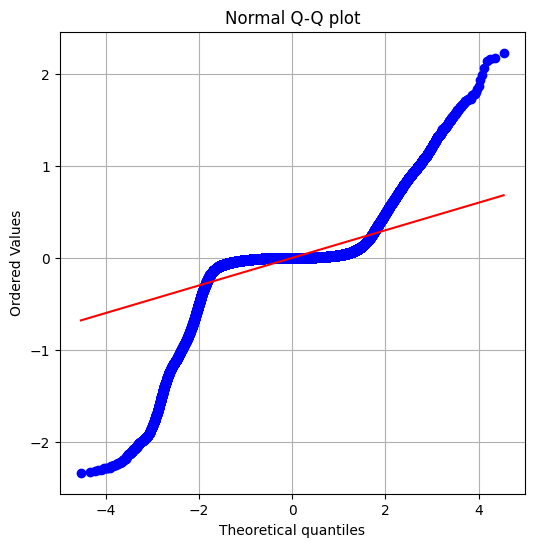

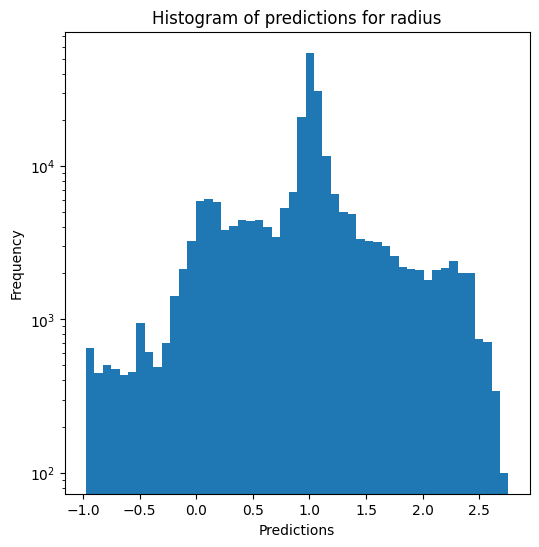

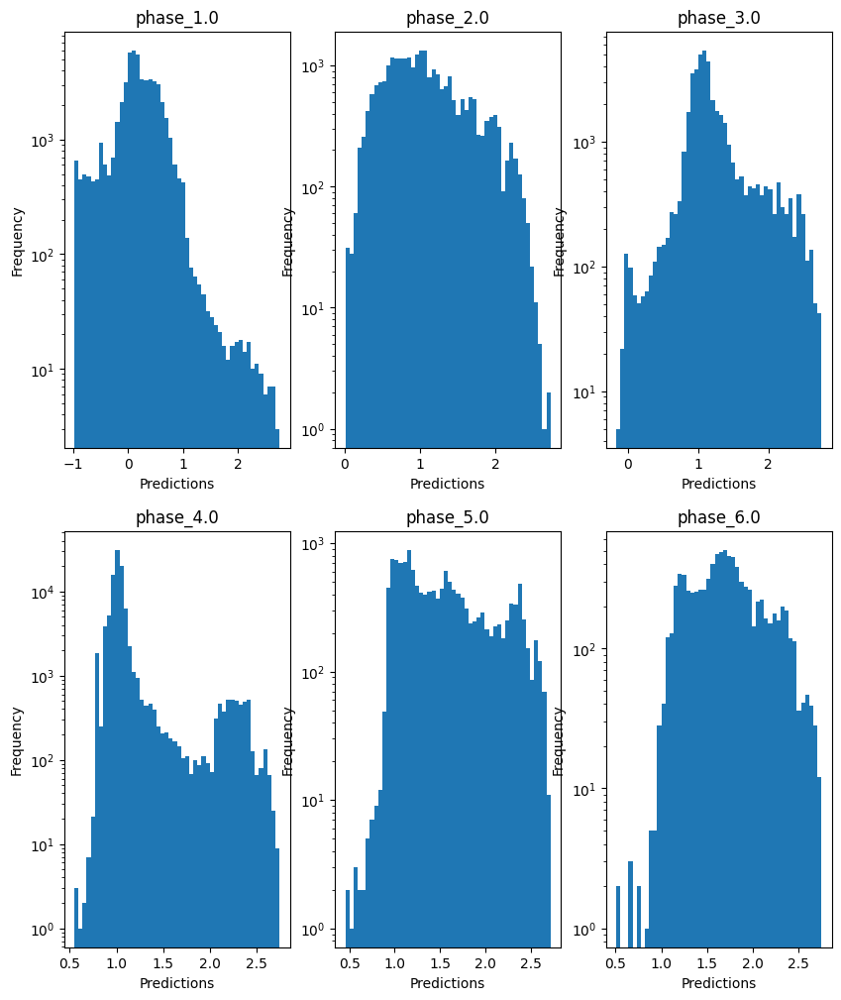

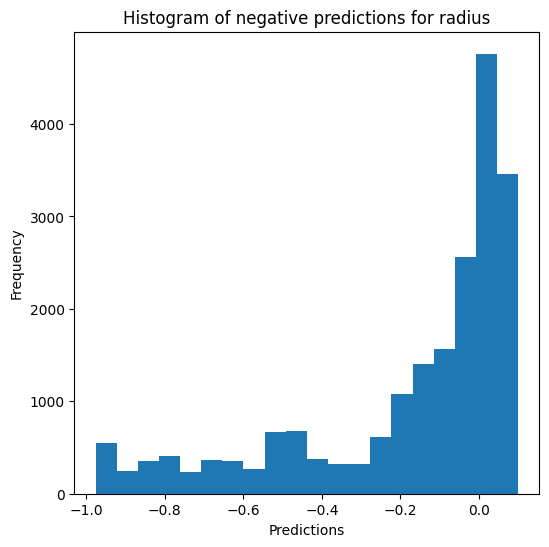

Saving predictions and results...


In [41]:
best_params_DT = {'criterion': 'friedman_mse', 'splitter': "best", 'max_depth': 75, 'min_samples_leaf': 5, 'min_samples_split': 4, 'max_features': None, 'max_leaf_nodes': None}

print(path_to_results)
dt_evaluator = Model_evaluator("decision_tree", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)
dt_evaluator.evaluate_Kfold_results(DecisionTreeRegressor, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, random_state=12, override=override, use_preds=use_preds, save=save, show=show, scaler_name="power", **best_params_DT)